# <center><font color=	DarkRed>Segmentez des clients d'un site e-commerce</font></center><br>
# <center><font color=	DarkRed>Entraînement des modèles de clustering</font></center><br>

## Importation des librairies

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import datetime as dt

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.neighbors import NearestNeighbors
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import ward, fcluster

#import scipy.stats as stats
#from scipy.spatial.distance import cdist
#from matplotlib.patches import Circle

import warnings
warnings.filterwarnings('ignore')

pd.options.display.max_columns = 40

## Declaration des fonctions

In [2]:
import fonction

# Chargement du jeu de données

In [4]:
data = pd.read_csv('../data/data_cleaned.csv')

In [5]:
data.head(3)

,customer_unique_id,customer_city,customer_state,geolocation_lat,geolocation_lng,Frais_de_port,horaire_achat,date_achat,annee_mois,mois_achat,heure_achat,Note_Moyenne_Commentaire,Moy_Paiment,Facilités,Delai_Moyen_livraison,Nb_moyen_produits_par_commandes,categorie_la_plus_achetee,Total_moyen_achats
0,0000366f3b9a7992bf8c76cfdf3221e2,cajamar,SP,-23.340262,-46.831085,12.00,6-11h,2018-05-10 10:56:27,201805,5,10.0,5.0,credit_card,8.0,7.0,1.0,home,129.9
1,0000b849f77a49e4a4ce2b2a4ca5be3f,osasco,SP,-23.559044,-46.788516,8.29,6-11h,2018-05-07 11:11:27,201805,5,11.0,4.0,credit_card,1.0,4.0,1.0,health_beauty,18.9
2,0000f46a3911fa3c0805444483337064,sao jose,SC,-27.543010,-48.634938,17.22,18-21h,2017-03-10 21:05:03,201703,3,21.0,3.0,credit_card,8.0,26.0,1.0,office,69.0


In [6]:
data.describe()

,geolocation_lat,geolocation_lng,Frais_de_port,annee_mois,mois_achat,heure_achat,Note_Moyenne_Commentaire,Facilités,Delai_Moyen_livraison,Nb_moyen_produits_par_commandes,Total_moyen_achats
count,93139.000000,93139.000000,93139.000000,93139.000000,93139.000000,93139.000000,93139.000000,93139.000000,93139.000000,93139.000000,93139.000000
mean,-21.179301,-46.175960,20.531507,201761.006184,6.066256,14.852124,4.115349,2.945834,-344.976637,1.144043,139.534092
std,5.623440,4.061529,16.159739,48.678263,3.222747,5.304542,1.323377,2.726910,2477.848452,0.539885,211.737437
min,-33.689890,-72.668821,0.000000,201609.000000,1.000000,0.000000,1.000000,0.000000,-17767.000000,1.000000,0.850000
25%,-23.589455,-48.108625,13.440000,201709.000000,3.000000,11.000000,4.000000,1.000000,7.000000,1.000000,47.000000
50%,-22.923561,-46.631157,16.600000,201801.000000,6.000000,15.000000,5.000000,2.000000,11.000000,1.000000,89.000000
75%,-20.130000,-43.599188,21.630000,201805.000000,8.000000,19.000000,5.000000,4.000000,16.000000,1.000000,150.000000
max,42.184003,-8.723762,409.680000,201809.000000,12.000000,23.000000,5.000000,24.000000,209.000000,21.000000,13440.000000


## <center><font color=darkRed>A - Segmentation RFM</font></center>

### <center><font color=darkBlue>1 - Analyse RFM</font></center>

**RFM** est une méthode utilisée pour analyser la valeur cliente.

**le RFM** aide l'entreprise à **comprendre les caractéristiques du client** en fonction de ses transactions historiques. 
Pour extraire des informations et des caractéristiques de leur comportement d'achat, nous devons analyser le facteur RFM.

- **Récence**:  nombre de jours depuis le dernier achat *(La dernière date de facturation est 2018-09-03, nous utiliserons cette date pour calculer la récence.)*
- **Fréquence**: nombre de commandes réalisées par le client
- **Monétaire**: montant total par transaction

In [7]:
data['date_achat'].max()

'2018-09-03 09:06:57'

In [8]:
NOW = dt.date(2018,9,3) 
data['date_achat']  = pd.DatetimeIndex(data.date_achat).date

In [9]:
df_recence = data.groupby(['customer_unique_id'],as_index=False)['date_achat'].max()
df_recence.columns = ['customer_unique_id','Last_Purchase_Date']

df_recence['recence'] = df_recence.Last_Purchase_Date.apply(lambda x:(NOW - x).days)
df_recence.drop(columns=['Last_Purchase_Date'],inplace=True)
df_recence.head()

,customer_unique_id,recence
0,0000366f3b9a7992bf8c76cfdf3221e2,116
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119
2,0000f46a3911fa3c0805444483337064,542
3,0000f6ccb0745a6a4b88665a16c9f078,326
4,0004aac84e0df4da2b147fca70cf8255,293


In [10]:
rfm_table = data.groupby('customer_unique_id').agg(
    #recence = ("date_achat", "max"),
    frequence = ("Nb_moyen_produits_par_commandes", "mean"),
    montant_cumulé = ("Total_moyen_achats", "sum")
)

In [11]:
rfm_table = df_recence.merge(rfm_table,left_on='customer_unique_id',right_on='customer_unique_id')

In [12]:
rfm_table

,customer_unique_id,recence,frequence,montant_cumulé
0,0000366f3b9a7992bf8c76cfdf3221e2,116,1.0,129.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,1.0,18.90
2,0000f46a3911fa3c0805444483337064,542,1.0,69.00
3,0000f6ccb0745a6a4b88665a16c9f078,326,1.0,25.99
4,0004aac84e0df4da2b147fca70cf8255,293,1.0,180.00
...,...,...,...,...
93134,fffcf5a5ff07b0908bd4e2dbc735a684,452,2.0,1570.00
93135,fffea47cd6d3cc0a88bd621562a9d061,267,1.0,64.89
93136,ffff371b4d645b6ecea244b27531430a,573,1.0,89.90
93137,ffff5962728ec6157033ef9805bacc48,124,1.0,115.00


In [13]:
rfm = rfm_table.copy()
rfm = rfm.set_index('customer_unique_id')
rfm.describe()

,recence,frequence,montant_cumulé
count,93139.000000,93139.000000,93139.000000
mean,242.626515,1.144043,139.534092
std,153.171664,0.539885,211.737437
min,0.000000,1.000000,0.850000
25%,119.000000,1.000000,47.000000
50%,223.000000,1.000000,89.000000
75%,352.000000,1.000000,150.000000
max,729.000000,21.000000,13440.000000


**Calcul du score RFM** :

Je vais diviser les métriques en segments à l'aide de quantiles.   
Je vais attribuer un score de 1 à 4 à chaque Récence, Fréquence et Monétaire respectivement. 

**1** est la valeur la plus élevée et **4** est la valeur la plus faible. 

Un score RFM final (valeur globale) est calculé simplement en combinant les numéros de score RFM individuels.

**Évaluation du client basée sur le score RFM**
- **score rfm >= 11** : meilleur client 
- **9 >= score rfm >= 10** : client à forte valeur ajoutée
- **7 >= rfm score >= 8** : client de valeur moyenne
- **5 >= rfm score >= 6** : client de faible valeur
- **score rfm <= 4** : client perdu

In [14]:
quantiles = rfm.quantile(q=[0.25, 0.5, 0.75])
quantiles = quantiles.to_dict()

In [15]:
rfm['R_quartile'] = rfm['recence'].apply(fonction.R_Class, args=('recence', quantiles))
rfm['F_quartile'] = rfm['frequence'].apply(fonction.FM_Class, args=('frequence',quantiles))
rfm['M_quartile'] = rfm['montant_cumulé'].apply(fonction.FM_Class,args=('montant_cumulé', quantiles))

#rfm_table['RFM_Segment'] = rfm_table.R_quartile.map(str)+rfm_table.F_quartile.map(str)+rfm_table.M_quartile.map(str)
rfm['RFM_Score'] = rfm[['R_quartile','F_quartile','M_quartile']].sum(axis=1)

#### <center><font color=darkGreen>1.1 - Segmentation RFM manuelle</font></center>

In [16]:
# Création des groupes
rfm['cluster'] = rfm.apply(fonction.RFM_level, axis=1)

# Ajout des données RFM au jeu de données
rfm_df = pd.merge(rfm,data,
                  how='left',
                  left_on='customer_unique_id',
                  right_on='customer_unique_id'
                  )

In [17]:
segment = rfm_df.groupby(['cluster']).agg(
    customers_count=pd.NamedAgg(column='customer_unique_id',
                                aggfunc='count'),
    recence=pd.NamedAgg(column='recence',
                        aggfunc='mean'),
    frequence=pd.NamedAgg(column='frequence',
                          aggfunc='mean'),
    Facilites=pd.NamedAgg(column='Facilités',
                         aggfunc='mean'),
    montant_cumulé=pd.NamedAgg(column='montant_cumulé',
                         aggfunc='mean'),
    Note_Moyenne_Commentaire=pd.NamedAgg(column='Note_Moyenne_Commentaire',
                         aggfunc='mean'),
    horaire_achat=pd.NamedAgg(column='horaire_achat',
                                      aggfunc=lambda x: x.mode()[0]),
    mois_achat=pd.NamedAgg(column='mois_achat',
                                      aggfunc=lambda x: x.mode()[0]),
    categorie_la_plus_achetee=pd.NamedAgg(column='categorie_la_plus_achetee',
                                      aggfunc=lambda x: x.mode()[0]),
    type_de_paiement=pd.NamedAgg(column='Moy_Paiment',
                             aggfunc=lambda x: x.mode()[0]),
    ville=pd.NamedAgg(column='customer_city',
                            aggfunc=lambda x: x.mode()[0])
)

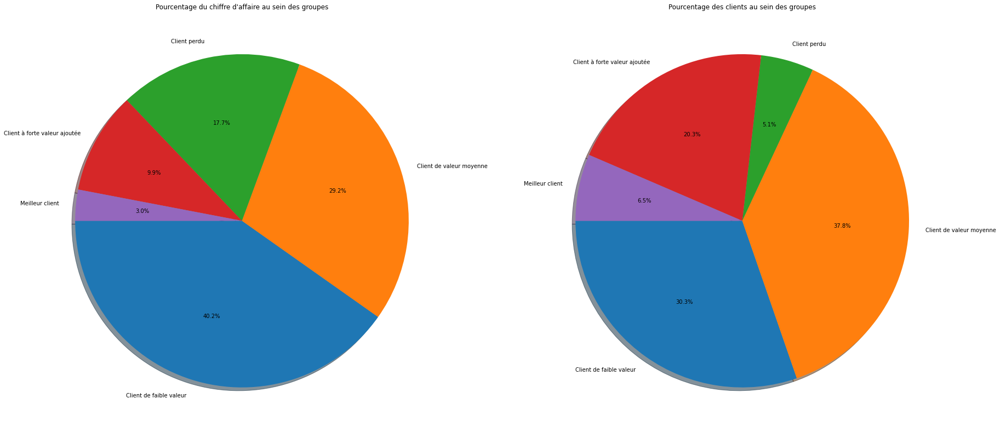

In [18]:
fonction.display_customers(rfm_df, rfm_df['cluster'].sort_values().unique(),'montant_cumulé')

In [19]:
segment.describe(include='all')

,customers_count,recence,frequence,Facilites,montant_cumulé,Note_Moyenne_Commentaire,horaire_achat,mois_achat,categorie_la_plus_achetee,type_de_paiement,ville
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5,5.000000,5,5,5
unique,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,3,1,1
top,NaN,NaN,NaN,NaN,NaN,NaN,14-18h,NaN,home,credit_card,sao paulo
freq,NaN,NaN,NaN,NaN,NaN,NaN,5,NaN,3,5,5
mean,18627.800000,217.972597,1.471327,3.225604,182.755435,4.009529,NaN,6.200000,NaN,NaN,NaN
std,13885.953756,115.917847,0.679189,0.874204,112.981735,0.227811,NaN,2.167948,NaN,NaN,NaN
min,2801.000000,107.083899,1.000000,2.009082,40.390704,3.638522,NaN,3.000000,NaN,NaN,NaN
25%,9193.000000,159.707930,1.008492,2.704641,105.162504,3.945556,NaN,5.000000,NaN,NaN,NaN
50%,16516.000000,160.502520,1.087187,3.360593,180.512842,4.114171,NaN,7.000000,NaN,NaN,NaN
75%,27183.000000,263.924051,1.687588,3.985719,287.546679,4.161606,NaN,8.000000,NaN,NaN,NaN


La segmentation RFM telle que définie montre une répartition homogène au niveau des clients, mais une grande part de client à faible valeur et valeur moyenne au niveau chiffre d'affaires.

- **Le dernier achat en moyenne est de 6 mois**
- **Le nombre de commandes realisées est en moyenne de 1,47**
- **Le montant moyen par commande est de 183 €**
- **La note moyenne des commentaires est de 4**
- **la catégorie Home est la plus achetée**
- **les clients perdus achètent principalement de l'electronique**. 
- **La population achète principalement l'après midi entre 14h et 18h**
- **Les meilleurs clients notent plus sévèrement**.



**Synthèse** 

**Meilleur client :** 
Représente 3% de la population globale.  
Le dernier achat remonte en moyenne à 3 mois dans la catégorie home avec des achats fréquent et de 300 € en moyenne.

**Client a forte valeur ajoutée :**
Représente 10% de la population globale.  
Le dernier achat remonte en moyenne à  4 mois dans la catégorie Home avec des achat assez fréquent et de 287 € en moyenne.

**Client de valeur moyenne :**
Représente 30% de la population globale.  
Le dernier achat remonte en moyenne à  4 mois dans la catégorie beauté avec des achats peu fréquent et de 180 € en moyenne.

**Client de faible valeur :**
Représente 40% de la population globale.  
Le dernier achat remonte en moyenne à 7 mois dans la catégorie Home avec peu d'achats et de 105 € en moyenne.

**Client perdu :**
Représente 17% de la population globale.  
Le dernier achat remonte en moyenne à plus d'un an dans la catégorie électronique avec très peu d'achats de 40 € en moyenne.

#### <center><font color=darkGreen>1.2 - Segmentation RFM kmeans</font></center>

##### <center><font color=darkorange>1.2.1 - Distribution et Normalisation</font></center>

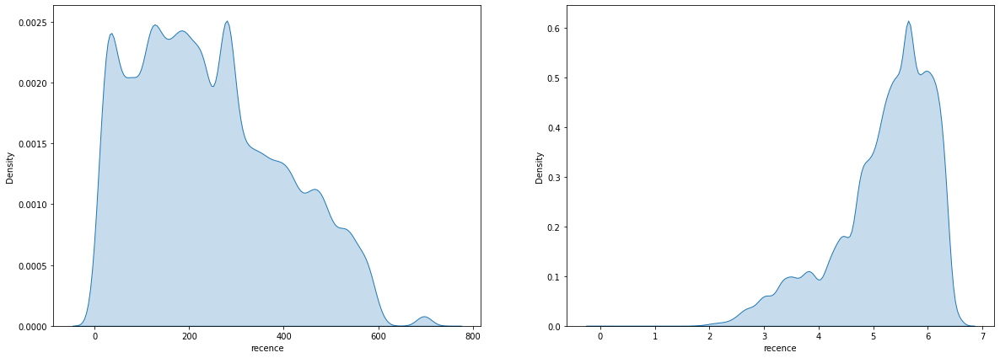

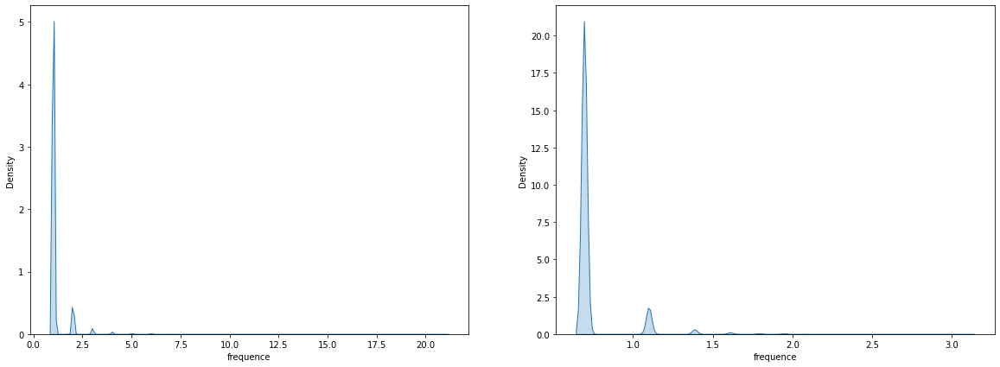

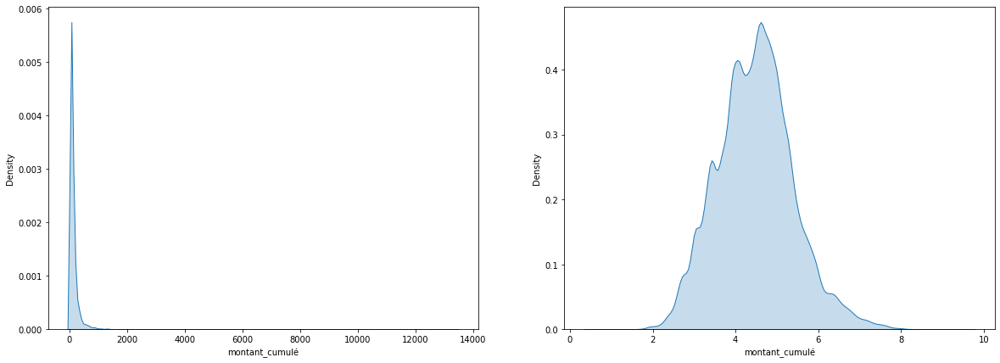

In [20]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))
sns.kdeplot(rfm_table['recence'], shade=True, ax=ax1)
sns.kdeplot(np.log1p(rfm_table['recence']), shade=True, ax=ax2)
plt.show()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))
sns.kdeplot(rfm_table['frequence'], shade=True, ax=ax1)
sns.kdeplot(np.log1p(rfm_table['frequence']), shade=True, ax=ax2)
plt.show()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))
sns.kdeplot(rfm_table['montant_cumulé'], shade=True, ax=ax1)
sns.kdeplot(np.log1p(rfm_table['montant_cumulé']), shade=True, ax=ax2)
plt.show()

#### <center><font color=darkOrange>1.2.2 - Mise a l'echelle des variables RFM</font></center>

Standardisez les caractéristiques en supprimant la moyenne et en mettant à l'échelle la variance unitaire.

In [21]:
rfm_table = rfm_table.set_index('customer_unique_id')

In [22]:
df_normal = rfm_table[['recence', 'montant_cumulé']]
df_normal['frequence'] = rfm_table[['frequence']].apply(np.log, axis = 1).round(3)
X_scaled_rfm = fonction.preprocess(df_normal, var_quali=None, stdScale=True)

#### <center><font color=darkOrange>1.2.3 - Kmeans</font></center>

Veuillez définir la plage de valeur de K (2,...) pour l'affichage de l'EB: 7


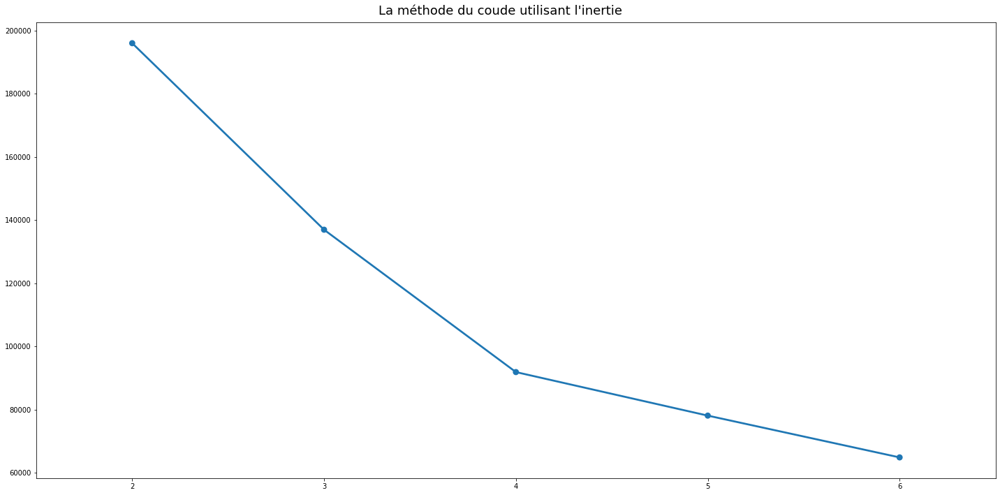

Veuillez définir le nombre de clusters : 4


,recence,montant_cumulé,frequence,cluster_kmeans
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.826701,-0.045500,-0.315354,3
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.807115,-0.569737,-0.315354,3
0000f46a3911fa3c0805444483337064,1.954507,-0.333122,-0.315354,0
0000f6ccb0745a6a4b88665a16c9f078,0.544317,-0.536252,-0.315354,0
0004aac84e0df4da2b147fca70cf8255,0.328871,0.191115,-0.315354,0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,1.366928,6.755884,2.276897,1
fffea47cd6d3cc0a88bd621562a9d061,0.159126,-0.352533,-0.315354,0
ffff371b4d645b6ecea244b27531430a,2.156895,-0.234415,-0.315354,0


In [23]:
df_kmeans_rfm = fonction.segmentation(data_scale=X_scaled_rfm,data_init=None,cah=False, 
                      method= 'ward', metric= 'euclidean', criterion= 'distance', 
                      Kmeans=True, init='k-means++', mixte_kmeans_cah=False, mixte_cah_kmeans=False, random_state=2611, silhouette=False)
df_kmeans_rfm

En utilisant uniquement les variables **Recence, Fréquence et Montant cumulée**, le nombre de groupes optimal selon le **score silhouette** est de 2, alors que par **la méthode "elbow"** 4 semble être le nombre de groupes optimal.

,recence,montant_cumulé,frequence
cluster,,,
0,0.98,0.40,0.32
1,0.85,4.86,0.57
2,0.83,0.48,2.79
3,0.73,0.38,0.32
mean,0.83,0.50,0.57


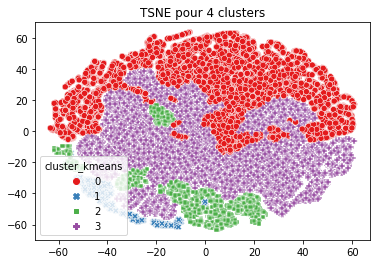

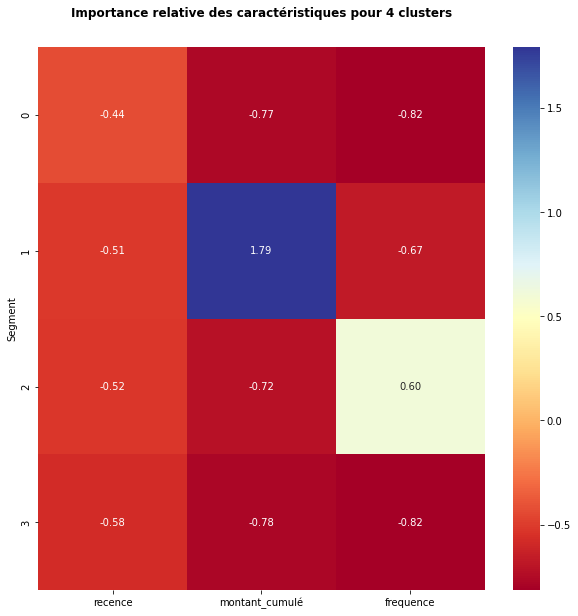

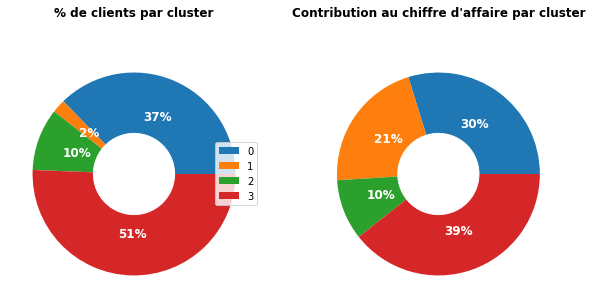

In [24]:
rfm_k4 = fonction.kmeans_TSNE_analysis(abs(X_scaled_rfm),  df_kmeans_rfm['cluster_kmeans'], 4,'montant_cumulé', heatmap=True)

Je vais tracer un snake plot , pour construire les personas de chaque cluster de la segmentation. 

Il est couramment utilisé dans l'industrie du marketing pour la segmentation de la clientèle.

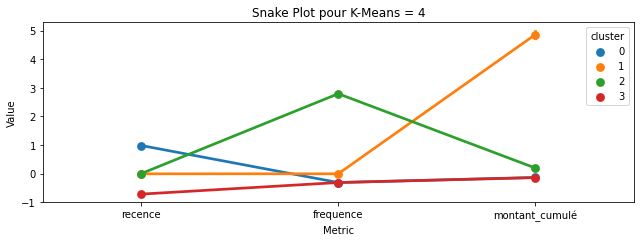

In [25]:
plt.figure(figsize=(9, 9))
plt.subplot(3, 1, 2)
plt.title('Snake Plot pour K-Means = 4')
fonction.snake_plot(X_scaled_rfm, df_kmeans_rfm['cluster_kmeans'], rfm_table)

plt.tight_layout()

#### <center><font color=darkOrange>1.2.4 - Synthèse </font></center>

In [26]:
cluster_info_rfm = fonction.cluster_info(rfm_table, df_kmeans_rfm['cluster_kmeans'], 
                                     seuil_importance_variable = 10, 
                                     seuil_cramer = 30, 
                                     correlations=True, 
                                     topVar=True, 
                                     chi2=True, 
                                     cramer=True) 

In [27]:
cluster_info_rfm

,recence,frequence,montant_cumulé,clients,clients (%)
0,392.618616,1.000000,110.283392,34713.0,37.27
1,240.936382,1.161531,1168.284732,2012.0,2.16
2,242.586144,2.414937,180.597725,9252.0,9.93
3,132.306730,1.000000,109.120041,47162.0,50.64
Gen,242.630000,1.140000,139.530000,NaN,NaN
%R2,62.006780,61.311254,53.124479,NaN,NaN


Afin de mieux interpréter mes groupes, je vais fusionner le résultat de ma segmentation avec le dataset initial, je vais ensuite agréger mes variables avec le mode, la median et la moyenne.

J'ai choisi la médiane pour la variable <code>Delai_Moyen_livraison</code>, car elle contient des valeurs extrêmes, si je prends la moyenne celle-ci sera influencé par ses valeurs extrêmes, et sera donc moins représentative.

In [93]:
info_gp = data.copy()
df_gp = pd.merge(info_gp, df_kmeans_rfm,
                               how='right', 
                               left_on='customer_unique_id', 
                               right_on='customer_unique_id'
                              )

In [99]:
result_rfm = df_gp.groupby('cluster_kmeans').agg(
            {#'customer_state': lambda x: x.mode()[0],
             #'customer_city' : lambda x: x.mode()[0],
             'Frais_de_port': 'mean',
             #'horaire_achat': lambda x: x.mode()[0],
             #'heure_achat':'mean',
             #'mois_achat': lambda x: x.mode()[0],
             'Note_Moyenne_Commentaire': 'mean',
             #'Moy_Paiment': lambda x: x.mode()[0],
             'Facilités': 'mean',
             'Delai_Moyen_livraison': 'median',
             'categorie_la_plus_achetee': lambda x: x.mode()[0],
             #'recence': 'max',
             #'frequence': 'max',
             #'montant_cumulé': 'max',
             
            }
        ).reset_index()

result_rfm = result_rfm.set_index('cluster_kmeans')
#result_rfm = pd.concat([result_rfm, cluster_info_rfm])

result_rfm

,Frais_de_port,Note_Moyenne_Commentaire,Facilités,Delai_Moyen_livraison,categorie_la_plus_achetee
cluster_kmeans,,,,,
0,19.191169,4.164304,2.962147,11.0,home
1,52.106869,4.014911,6.442843,12.0,electronics
2,19.996249,3.648184,3.518158,10.0,home
3,20.275998,4.175247,2.672363,10.0,electronics


In [100]:
info = pd.merge(result_rfm, cluster_info_rfm,
                               how='right', 
                               left_on='cluster_kmeans', 
                               right_on=cluster_info_rfm.index)
                
info = info.set_index('cluster_kmeans')
info = info.dropna(axis=0)
info
#info.iloc[:,:9]

,Frais_de_port,Note_Moyenne_Commentaire,Facilités,Delai_Moyen_livraison,categorie_la_plus_achetee,recence,frequence,montant_cumulé,clients,clients (%)
cluster_kmeans,,,,,,,,,,
0,19.191169,4.164304,2.962147,11.0,home,392.618616,1.000000,110.283392,34713.0,37.27
1,52.106869,4.014911,6.442843,12.0,electronics,240.936382,1.161531,1168.284732,2012.0,2.16
2,19.996249,3.648184,3.518158,10.0,home,242.586144,2.414937,180.597725,9252.0,9.93
3,20.275998,4.175247,2.672363,10.0,electronics,132.306730,1.000000,109.120041,47162.0,50.64


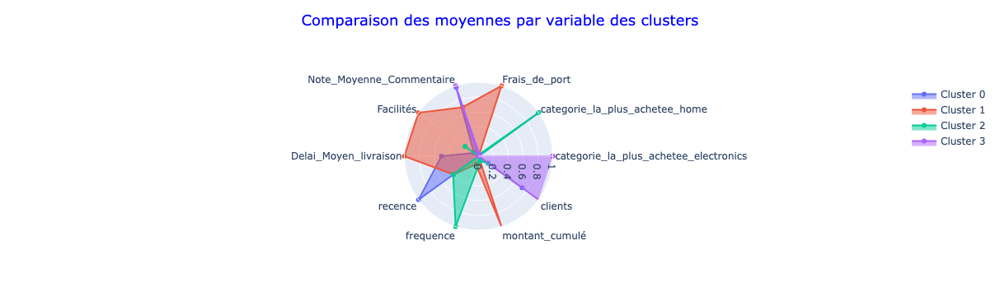

In [101]:
fonction.plot_radars(data=info.iloc[:,:9],stdScale=True)

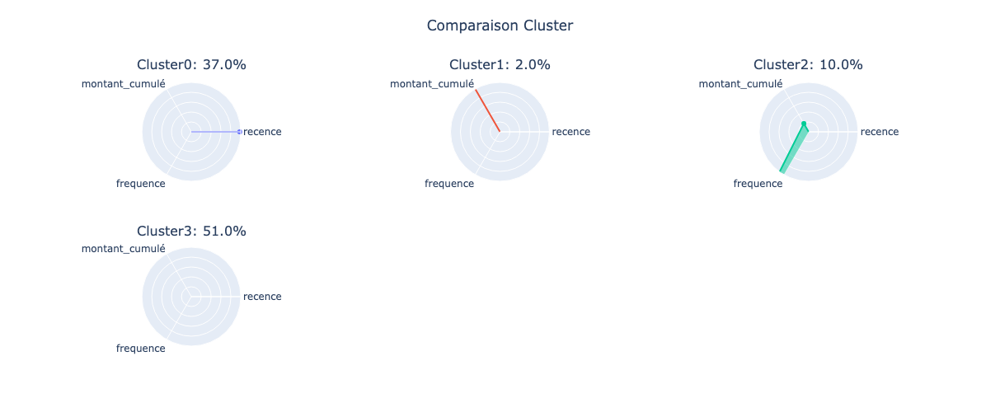

<Figure size 1440x2880 with 0 Axes>

In [32]:
info_gp_rfm = df_kmeans_rfm.groupby("cluster_kmeans").mean()
fonction.plot_chart_clusters(df_kmeans_rfm, info_gp_rfm,'cluster_kmeans',
                               k_range=range(0,4), rows=2, cols=3)

**Cluster 0 :** 
Représente 8% de la population globale, 12% du chiffre d'affaires.  
Client assez récent avec achat fréquent et de grandes valeurs ***(Client fidèle)***.

**Cluster 1 :**
Représente 35% de la population globale, 33% du chiffre d'affaires.   
Client relativement récent avec un achat inférieur à la moyenne ***(à suivre)***.

**Cluster 2 :**
Représente 34% de la population globale, 31% du chiffre d'affaires.  
Client ancien avec achat peu fréquent de valeur très faible ***(Client de faible valeur)***.

**Cluster 3:**
Représente 23% de la population globale, 23% du chiffre d'affaires.   
Client très ancien avec achat fréquent de valeur élevée ***(Client perdu)***.


**<center>Conclusion</center>**

Avec 4 groupes, on ne distingue qu'une différence dans la **récence**, la **fréquence** et le **montant** étant très proche entre eux. 

Cette division en 4 groupes montre des valeurs relativement similaires, de ce fait, les données ne sont pas exploitables, il faut donc **ajouter d'autres variables pour construire les groupes**.


### <center><font color=darkBlue>2 - Analyse du jeu de données initial sans RFM</font></center>

In [8]:
data_init = data.copy()
data_init = data_init.set_index('customer_unique_id')
#data['mois_achat'] = data['mois_achat'].astype('object')
data_init.head(3)

,customer_city,customer_state,geolocation_lat,geolocation_lng,Frais_de_port,horaire_achat,date_achat,annee_mois,mois_achat,heure_achat,Note_Moyenne_Commentaire,Moy_Paiment,Facilités,Delai_Moyen_livraison,Nb_moyen_produits_par_commandes,categorie_la_plus_achetee,Total_moyen_achats
customer_unique_id,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,cajamar,SP,-23.340262,-46.831085,12.00,6-11h,2018-05-10 10:56:27,201805,5,10.0,5.0,credit_card,8.0,7.0,1.0,home,129.9
0000b849f77a49e4a4ce2b2a4ca5be3f,osasco,SP,-23.559044,-46.788516,8.29,6-11h,2018-05-07 11:11:27,201805,5,11.0,4.0,credit_card,1.0,4.0,1.0,health_beauty,18.9
0000f46a3911fa3c0805444483337064,sao jose,SC,-27.543010,-48.634938,17.22,18-21h,2017-03-10 21:05:03,201703,3,21.0,3.0,credit_card,8.0,26.0,1.0,office,69.0


Je sélectionne les données que je souhaite utiliser pour ma segmentation, je supprime les données de géolocalisation et de date.
Je supprime également les données sur les horaires et le moyen de paiement, car ses données sont desiquilibrées ainsi que le délai moyen de livraison qui présente des valeurs extrêmes et qui risque de biaiser la segmentation.

J'utiliserai les données supprimées ci-dessous pour expliquer mes clusters.

In [9]:
data_init = data_init.drop(['customer_city',
                            'customer_state',
                            'geolocation_lat', 
                            'geolocation_lng',
                            'horaire_achat',
                            'date_achat',
                            'annee_mois',
                            'mois_achat',
                            'heure_achat',
                            #'Facilités',
                            #'Delai_Moyen_livraison',
                            'Moy_Paiment',
                            #'Delai_Moyen_livraison'
                           ], axis=1)

#### <center><font color=darkGreen>2.1 - Encodage et Mise a l'echelle</font></center>

Standardisez les caractéristiques en supprimant la moyenne et en mettant à l'échelle la variance unitaire.

In [10]:
#data_init['Nb_moyen_produits_par_commandes'] = data_init['Nb_moyen_produits_par_commandes'].apply(np.log, axis = 1).round(3)
X_scaled_global = fonction.preprocess(data_init, var_quali=None, stdScale=False)

#### <center><font color=darkGreen>2.2 - Kmeans</font></center>

Veuillez définir la plage de valeur de K (2,...) pour l'affichage de l'EB: 10


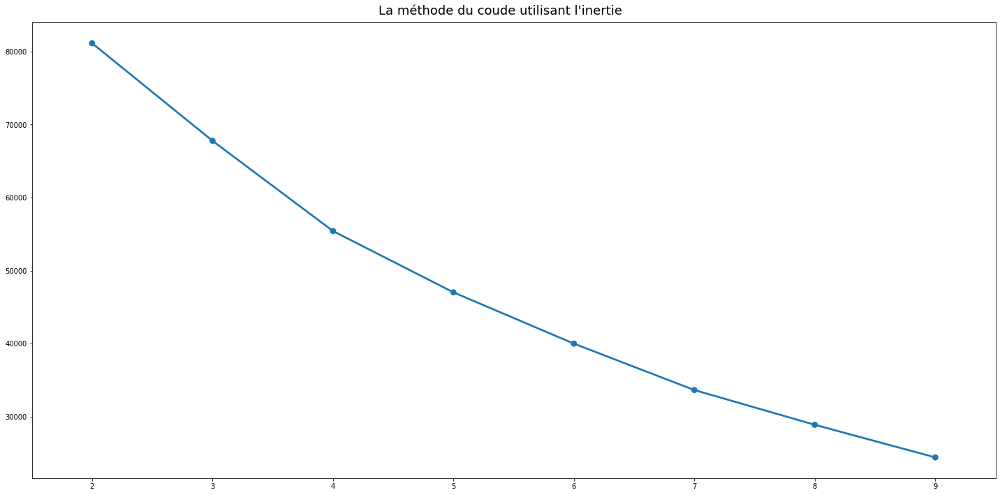

Veuillez définir le nombre de clusters : 4


,categorie_la_plus_achetee_appliances,categorie_la_plus_achetee_arts,categorie_la_plus_achetee_auto,categorie_la_plus_achetee_construction,categorie_la_plus_achetee_electronics,categorie_la_plus_achetee_fashion,categorie_la_plus_achetee_food_drinks,categorie_la_plus_achetee_garden_pets,categorie_la_plus_achetee_health_beauty,categorie_la_plus_achetee_home,categorie_la_plus_achetee_office,categorie_la_plus_achetee_other,categorie_la_plus_achetee_sports_leisure,Frais_de_port,Note_Moyenne_Commentaire,Facilités,Delai_Moyen_livraison,Nb_moyen_produits_par_commandes,Total_moyen_achats,cluster_kmeans
customer_unique_id,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0,0,0,0,0,0,0,0,0,1,0,0,0,0.029291,1.00,0.333333,0.988763,0.00,0.009603,1
0000b849f77a49e4a4ce2b2a4ca5be3f,0,0,0,0,0,0,0,0,1,0,0,0,0,0.020235,0.75,0.041667,0.988596,0.00,0.001343,3
0000f46a3911fa3c0805444483337064,0,0,0,0,0,0,0,0,0,0,1,0,0,0.042033,0.50,0.333333,0.989820,0.00,0.005071,0
0000f6ccb0745a6a4b88665a16c9f078,0,0,0,0,1,0,0,0,0,0,0,0,0,0.043034,0.75,0.166667,0.989542,0.00,0.001871,2
0004aac84e0df4da2b147fca70cf8255,0,0,0,0,1,0,0,0,0,0,0,0,0,0.041227,1.00,0.250000,0.989152,0.00,0.013330,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,0,0,0,0,0,0,0,0,1,0,0,0,0,0.630443,1.00,0.416667,0.989931,0.05,0.116760,3
fffea47cd6d3cc0a88bd621562a9d061,0,0,0,0,0,0,0,0,1,0,0,0,0,0.048062,0.75,0.041667,0.990098,0.00,0.004765,3
ffff371b4d645b6ecea244b27531430a,0,0,1,0,0,0,0,0,0,0,0,0,0,0.055067,1.00,0.041667,0.989208,0.00,0.006626,0


In [12]:
kmeans_global = fonction.segmentation(data_scale=X_scaled_global,data_init=None,cah=False, 
                      method= 'ward', metric= 'euclidean', criterion= 'distance', 
                      Kmeans=True, init='k-means++', mixte_kmeans_cah=False, mixte_cah_kmeans=False, random_state=2611, silhouette=False)
kmeans_global

,categorie_la_plus_achetee_appliances,categorie_la_plus_achetee_arts,categorie_la_plus_achetee_auto,categorie_la_plus_achetee_construction,categorie_la_plus_achetee_electronics,categorie_la_plus_achetee_fashion,categorie_la_plus_achetee_food_drinks,categorie_la_plus_achetee_garden_pets,categorie_la_plus_achetee_health_beauty,categorie_la_plus_achetee_home,categorie_la_plus_achetee_office,categorie_la_plus_achetee_other,categorie_la_plus_achetee_sports_leisure,Frais_de_port,Note_Moyenne_Commentaire,Facilités,Delai_Moyen_livraison,Nb_moyen_produits_par_commandes,Total_moyen_achats
cluster,,,,,,,,,,,,,,,,,,,
0,0.15,0.10,0.08,0.04,0.00,0.16,0.02,0.10,0.00,0.00,0.08,0.08,0.19,0.05,0.79,0.12,0.97,0.01,0.01
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.05,0.75,0.14,0.97,0.01,0.01
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.05,0.79,0.13,0.97,0.00,0.01
3,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.04,0.76,0.09,0.97,0.01,0.01
mean,0.08,0.05,0.04,0.02,0.16,0.08,0.01,0.05,0.15,0.17,0.04,0.04,0.10,0.05,0.78,0.12,0.97,0.01,0.01


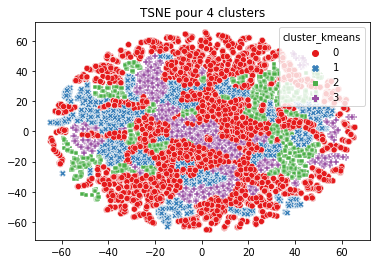

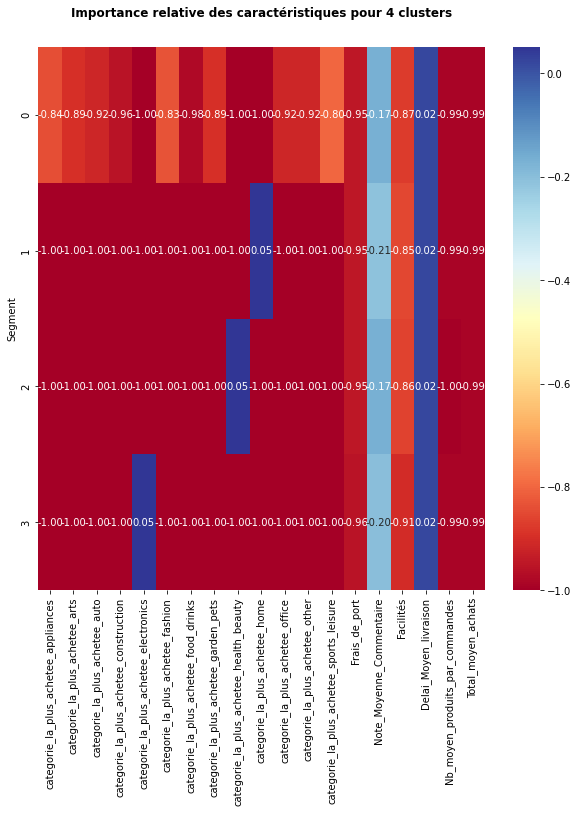

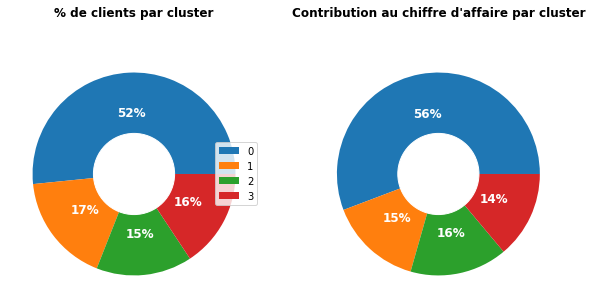

In [37]:
init_k4 = fonction.kmeans_TSNE_analysis(abs(X_scaled_global),  kmeans_global['cluster_kmeans'], 4,'Total_moyen_achats', heatmap=True)

#### <center><font color=darkGreen>2.3 - Synthèse </font></center>

In [38]:
cluster_info_global = fonction.cluster_info(data_init, kmeans_global['cluster_kmeans'], 
                                     seuil_importance_variable = 10, 
                                     seuil_cramer = 30, 
                                     correlations=True, 
                                     topVar=True, 
                                     chi2=True, 
                                     cramer=True) 

In [39]:
cluster_info_global

,Frais_de_port,Note_Moyenne_Commentaire,Facilités,Delai_Moyen_livraison,Nb_moyen_produits_par_commandes,Total_moyen_achats,categorie_la_plus_achetee_appliances,categorie_la_plus_achetee_arts,categorie_la_plus_achetee_auto,categorie_la_plus_achetee_construction,categorie_la_plus_achetee_electronics,categorie_la_plus_achetee_fashion,categorie_la_plus_achetee_food_drinks,categorie_la_plus_achetee_garden_pets,categorie_la_plus_achetee_health_beauty,categorie_la_plus_achetee_home,categorie_la_plus_achetee_office,categorie_la_plus_achetee_other,categorie_la_plus_achetee_sports_leisure,clients,clients (%)
0,21.396535,4.154378,2.967014,-355.719132,1.130237,150.760926,0.146136,0.099852,0.077147,0.041893,0.000000,0.157728,0.018938,0.10441,0.000000,0.000000,0.084161,0.079853,0.189882,48051.0,51.59
1,21.209707,4.014973,3.388933,-285.665044,1.246288,118.779283,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000,16229.0,17.42
2,19.431263,4.174782,3.090641,-351.570545,1.094576,141.779801,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000,0.000000,0.000000,0.000000,14232.0,15.28
3,18.007861,4.040678,2.243727,-369.078348,1.124086,123.495827,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,14627.0,15.70
Gen,20.530000,4.120000,2.950000,-344.980000,1.140000,139.530000,0.080000,0.050000,0.040000,0.020000,0.160000,0.080000,0.010000,0.05000,0.150000,0.170000,0.040000,0.040000,0.100000,NaN,NaN
%R2,0.632374,0.227170,1.547609,0.012548,0.814036,0.404286,7.681668,5.101011,3.889554,2.085114,100.006597,8.314410,0.926378,5.37150,100.006073,100.012524,4.287230,4.035333,10.195005,NaN,NaN


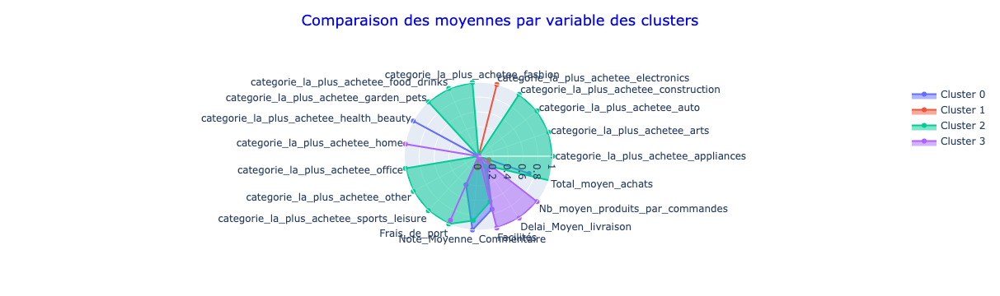

In [109]:
info_gp_global = kmeans_global.groupby("cluster_kmeans").mean()
fonction.plot_radars(data=info_gp_global,stdScale=True)

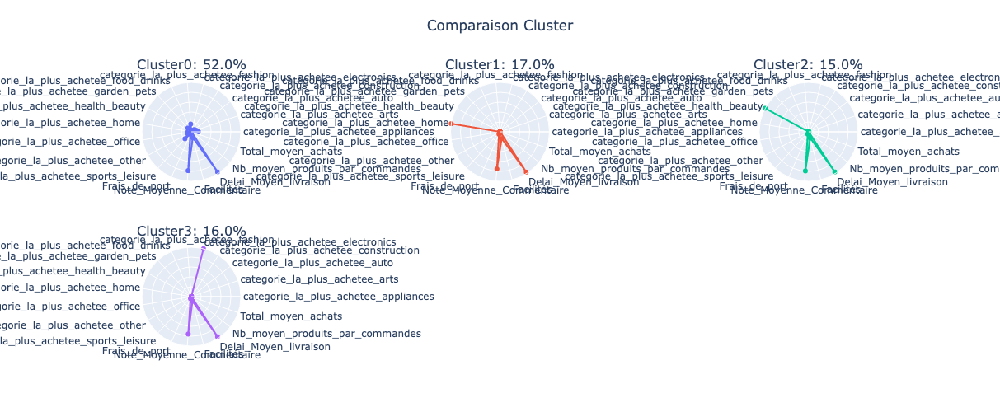

<Figure size 1440x2880 with 0 Axes>

In [41]:
info_gp= kmeans_global.groupby("cluster_kmeans").mean()
fonction.plot_chart_clusters(kmeans_global, info_gp_global,'cluster_kmeans',
                               k_range=range(0,4), rows=2, cols=3)

In [42]:
info_global = data.copy()
info_global = info_global.set_index('customer_unique_id')

In [43]:
info_global["cluster_kmeans"] = kmeans_global['cluster_kmeans']
result_global = info_global.groupby('cluster_kmeans').agg(
            {#'customer_state': lambda x: x.mode()[0],
             'customer_city' : lambda x: x.mode()[0],
             'Frais_de_port': 'mean',
             #'horaire_achat': lambda x: x.mode()[0],
             #'heure_achat':'mean',
             'mois_achat': lambda x: x.mode()[0],
             'Note_Moyenne_Commentaire': 'mean',
             'Moy_Paiment': lambda x: x.mode()[0],
             'Facilités': 'mean',
             'Delai_Moyen_livraison': 'median',
             'Nb_moyen_produits_par_commandes':'mean',
             'categorie_la_plus_achetee': lambda x: x.mode()[0],
             'Total_moyen_achats': 'mean'
            }
        ).reset_index()

result_global = result_global.set_index('cluster_kmeans')

In [44]:
info = pd.merge(result_global, cluster_info_global[['clients','clients (%)']],
                               how='right', 
                               left_on='cluster_kmeans', 
                               right_on=cluster_info_global.index)
                
info = info.set_index('cluster_kmeans')
info = info.dropna(axis=0)
info
#info.iloc[:,:9]

,customer_city,Frais_de_port,mois_achat,Note_Moyenne_Commentaire,Moy_Paiment,Facilités,Delai_Moyen_livraison,Nb_moyen_produits_par_commandes,categorie_la_plus_achetee,Total_moyen_achats,clients,clients (%)
cluster_kmeans,,,,,,,,,,,,
0,sao paulo,21.396535,8.0,4.154378,credit_card,2.967014,10.0,1.130237,sports_leisure,150.760926,48051.0,51.59
1,sao paulo,21.209707,8.0,4.014973,credit_card,3.388933,11.0,1.246288,home,118.779283,16229.0,17.42
2,sao paulo,19.431263,8.0,4.174782,credit_card,3.090641,10.0,1.094576,health_beauty,141.779801,14232.0,15.28
3,sao paulo,18.007861,2.0,4.040678,credit_card,2.243727,11.0,1.124086,electronics,123.495827,14627.0,15.70


#### <center><font color=darkGreen>2.4 - ACP </font></center>

In [13]:
data_acp = data_init.copy()

In [14]:
#data_acp['Nb_moyen_produits_par_commandes'] = data_acp[['Nb_moyen_produits_par_commandes']].apply(np.log, axis = 1).round(3)

In [15]:
X_scaled_data = fonction.preprocess(data_acp, var_quali=None, stdScale=True)

In [16]:
numerical_columns = data_acp.select_dtypes(['int32','float64','uint8']).columns
X_scaled_num = X_scaled_global[numerical_columns]

In [17]:
# Instantiate PCA
pca = PCA()

# Compute PCA and get the projection of the data
X_pca = pca.fit_transform(X_scaled_data)
#X_pca = pca.fit_transform(X)

##### <center><font color=darkOrange>2.4.1 - Contrôler l'ACP par un diagramme de pareto</font></center>

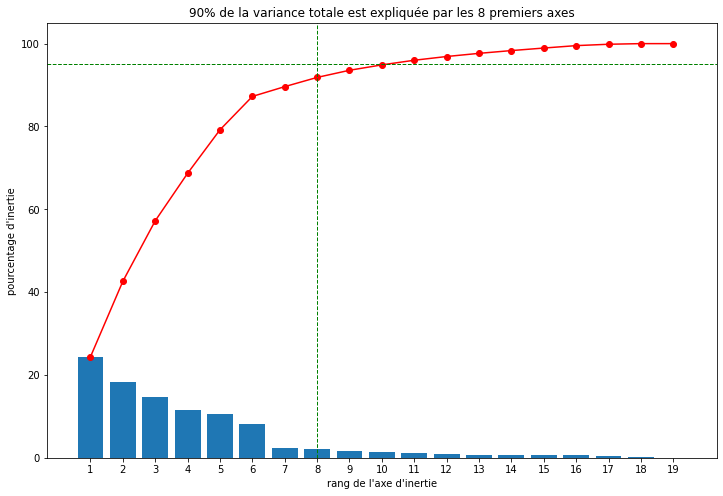

In [18]:
# Explained variance
varexpl = pca.explained_variance_ratio_*100

# Plot of cumulated variance
plt.figure(figsize=(12,8))
plt.bar(np.arange(len(varexpl))+1, varexpl)

cumSumVar = varexpl.cumsum()
plt.plot(np.arange(len(varexpl))+1, cumSumVar,c="red",marker='o')
plt.axhline(y=95, linestyle="--", 
            color="green",
            linewidth=1)

limit = 90
valid_idx = np.where(cumSumVar >= limit)[0]
min_plans = valid_idx[cumSumVar[valid_idx].argmin()]+1
plt.axvline(x=min_plans, linestyle="--", 
            color="green",
            linewidth=1)

plt.xlabel("rang de l'axe d'inertie")
plt.xticks(np.arange(len(varexpl))+1)
plt.ylabel("pourcentage d'inertie")
plt.title("{}% de la variance totale est expliquée"\
          " par les {} premiers axes".format(limit,
                                            min_plans))
plt.show(block=False)

##### <center><font color=darkGreen>2.4.2 - Visualiser les cercles de correlations</font></center>

In [19]:
from sklearn import decomposition
# sélection du nombre de composants principaux
num_components = 8
pca = decomposition.PCA(n_components=num_components, random_state=42)
pca.fit_transform(X_scaled_data)


# Transform the scaled data to the new PCA space
X_reduced = pca.transform(X_scaled_data)

In [20]:
#pca = PCA(n_components=11)
#pca.fit_transform(X_scaled_global)

df_pca_components = pd.DataFrame(
    data=pca.components_.round(4),
    columns=X_scaled_data.columns.values,
    index=['DIM{}'.format(i) for i in range(1, X_reduced[:,:8].shape[1]+1)])
    #index=['component 1', 'component 2', 'component 3'])

df_pca_components

,categorie_la_plus_achetee_appliances,categorie_la_plus_achetee_arts,categorie_la_plus_achetee_auto,categorie_la_plus_achetee_construction,categorie_la_plus_achetee_electronics,categorie_la_plus_achetee_fashion,categorie_la_plus_achetee_food_drinks,categorie_la_plus_achetee_garden_pets,categorie_la_plus_achetee_health_beauty,categorie_la_plus_achetee_home,categorie_la_plus_achetee_office,categorie_la_plus_achetee_other,categorie_la_plus_achetee_sports_leisure,Frais_de_port,Note_Moyenne_Commentaire,Facilités,Delai_Moyen_livraison,Nb_moyen_produits_par_commandes,Total_moyen_achats
DIM1,0.0043,-0.0065,0.0012,0.0043,-0.0262,0.0030,-0.0033,0.0027,-0.0030,0.0111,0.0084,0.0049,-0.0009,0.5401,-0.1642,0.4942,-0.0996,0.2194,0.6149
DIM2,-0.0019,-0.0017,-0.0007,-0.0009,0.0146,-0.0011,0.0006,-0.0022,-0.0063,0.0083,-0.0012,-0.0039,-0.0038,-0.1414,-0.6888,-0.1310,-0.6663,0.1704,-0.1226
DIM3,-0.0030,-0.0061,-0.0056,0.0019,0.0029,-0.0044,0.0018,0.0041,-0.0121,0.0332,-0.0011,-0.0061,-0.0055,-0.2999,-0.0327,-0.0273,0.3300,0.8932,0.0109
DIM4,0.0057,-0.0022,0.0048,0.0019,0.0295,-0.0277,0.0010,0.0088,-0.0210,-0.0272,0.0137,-0.0029,0.0155,0.5204,-0.0905,-0.8143,0.1377,0.0942,0.1634
DIM5,0.0048,0.0030,-0.0010,0.0011,-0.0009,-0.0008,0.0018,0.0035,0.0027,-0.0207,-0.0023,-0.0004,0.0092,-0.0543,0.6894,-0.1573,-0.6411,0.2379,0.1699
DIM6,-0.0118,0.0037,0.0024,0.0009,0.0408,0.0445,-0.0001,-0.0137,0.0202,-0.0747,-0.0162,0.0042,-0.0002,-0.5664,-0.1162,-0.2124,0.0850,-0.2381,0.7392
DIM7,-0.0295,-0.0086,-0.0069,-0.0052,-0.3515,-0.0133,-0.0013,-0.0199,-0.3599,0.8566,-0.0166,-0.0086,-0.0353,-0.0362,0.0081,-0.0517,-0.0069,-0.0477,0.0597
DIM8,-0.0035,-0.0032,-0.0023,-0.0004,0.7182,0.0010,-0.0014,-0.0034,-0.6941,0.0047,-0.0019,0.0008,-0.0144,0.0045,0.0148,0.0422,-0.0032,-0.0075,-0.0045


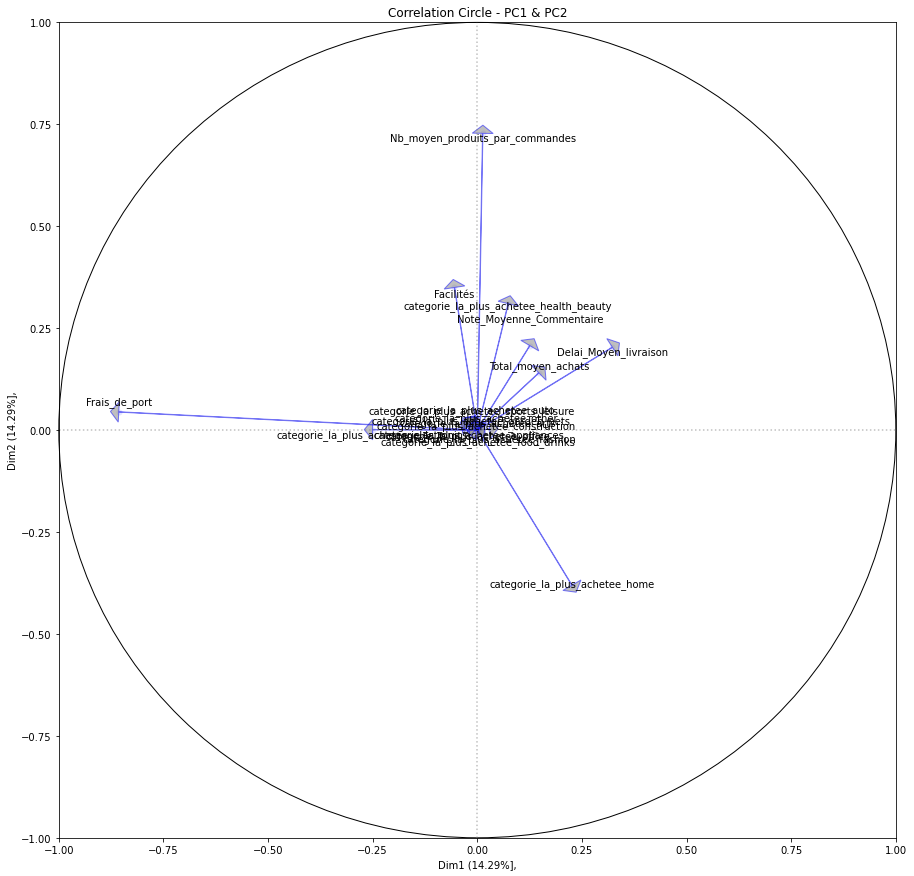

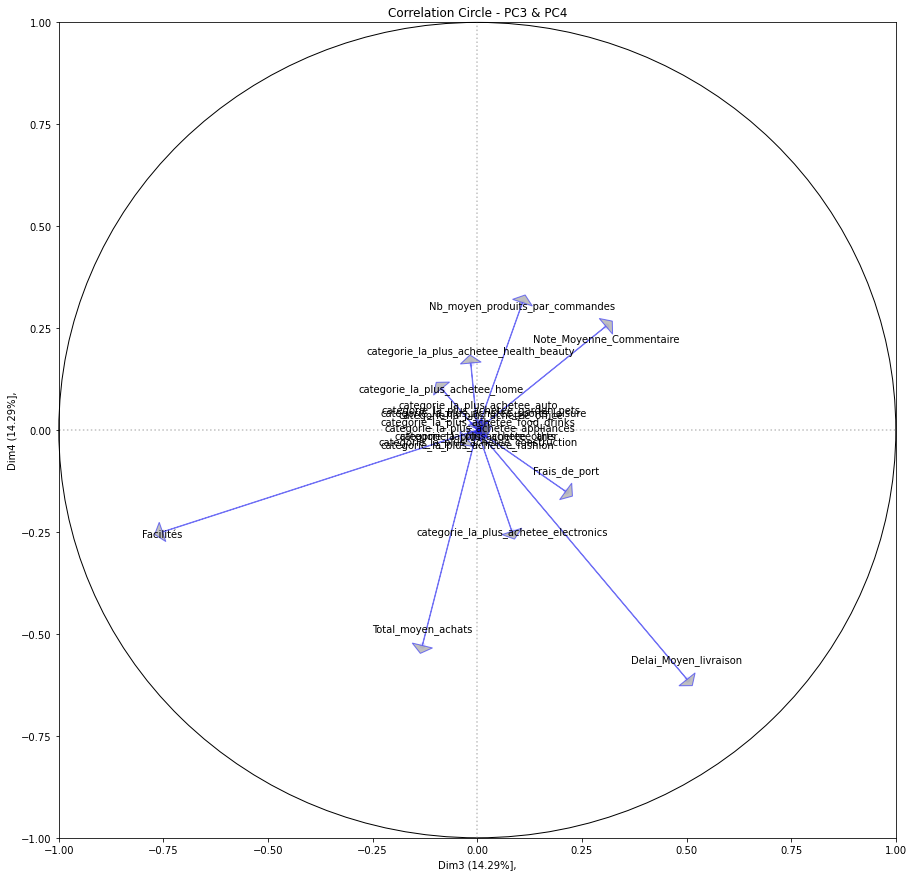

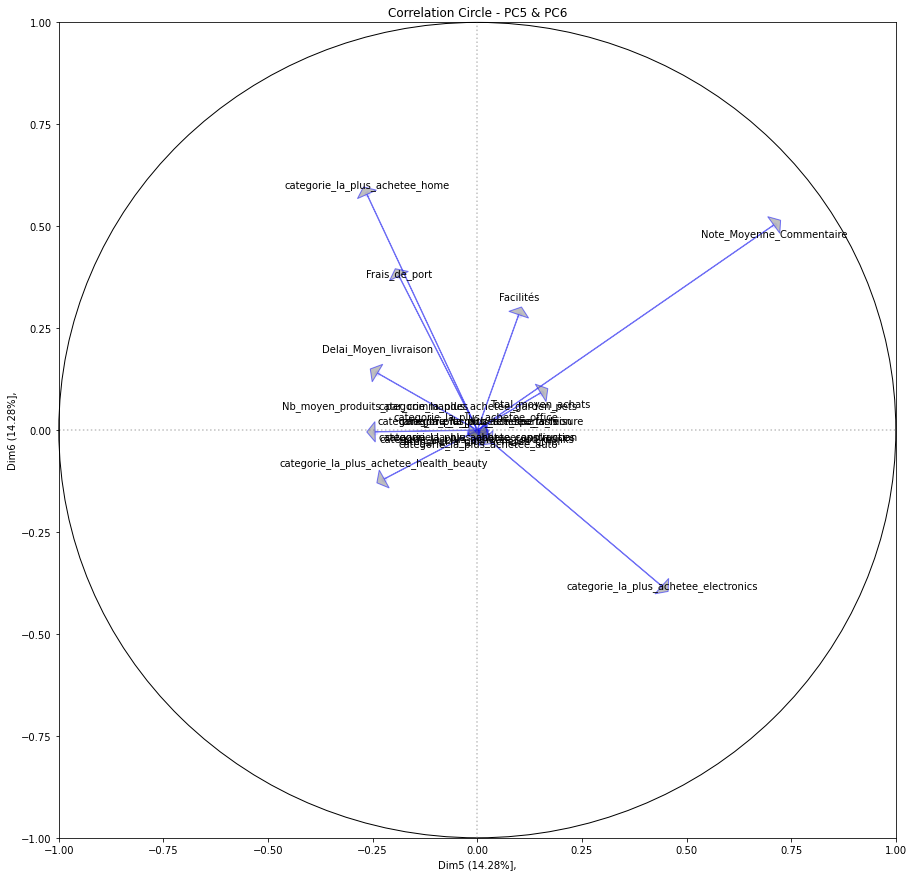

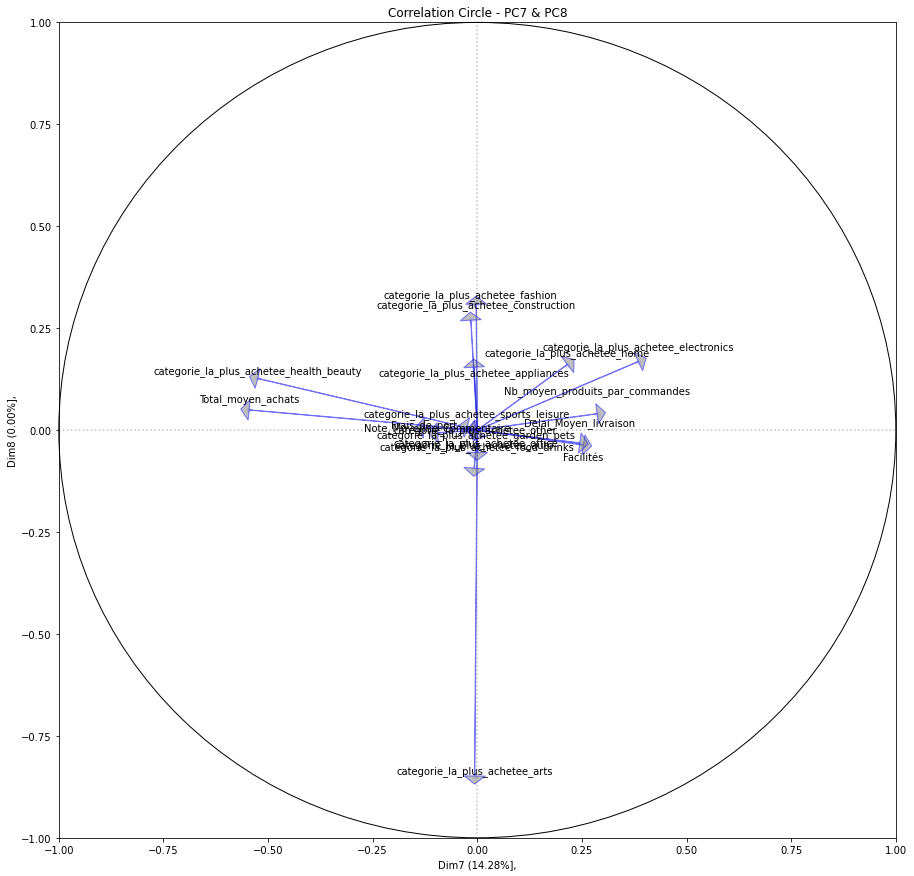

In [21]:
fonction.pca_correlation_circle(df_pca_components, dim_a=0, dim_b=1)
fonction.pca_correlation_circle(df_pca_components, dim_a=2, dim_b=3)
fonction.pca_correlation_circle(df_pca_components, dim_a=4, dim_b=5)
fonction.pca_correlation_circle(df_pca_components, dim_a=6, dim_b=7)

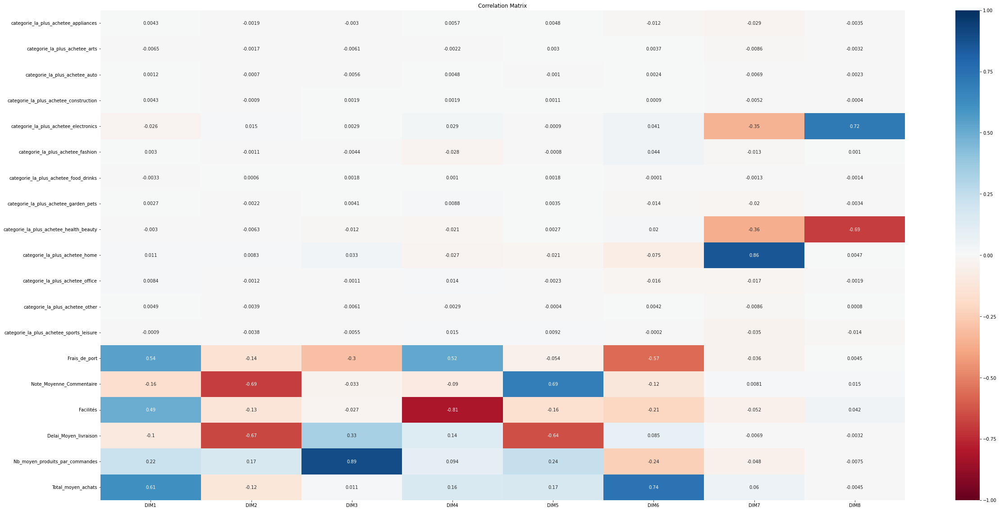

In [22]:
fig, ax = plt.subplots(figsize=(40, 20))
s = sns.heatmap(
    df_pca_components.T,
    vmin=-1,
    vmax=1,
    cmap='RdBu',
    annot=True
)
plt.title('Correlation Matrix')
plt.show()

- Dim 1 : **Coût global**: corrélation positive du total des achats, de la facilité de paiement et des frais de port *(les clients qui ont un panier elevé utilise le plus les facilités de paiement et ont des frais de port élevés ?)*
- Dim 2 : **satisfaction** : corrélation négative avec les notes de commentaire et les délais de livraison (les clients qui sont mécontant ont des délais de livraison élevée)
- Dim 3 : **fréquence** : corrélation positive avec le nombre de produits par commande et les délais de livraison et négative avec les frais de port *(Les clients qui commandent plusieurs produits ont des délais de livraison longs et des frais de port élevée)*
- Dim 4 : **crédit** :corrélation négative avec les facilités de paiement et positive avec les frais de port *(les clients qui utilisent les facilités de paiement ont des frais de port faible)*
- Dim 5 : **délai de livraison** : corrélation positive des notes de commentaire et négative des délais de livraison *(les clients qui sont satisfaits ont des délais de livraison courts)*
- Dim 6 : **frais de livraison** : corrélation positive du total des achats et négative des frais de port *(Les clients qui ont un total élevé ont également des frais de port élevés et inversement)*
- Dim 7 : **catégorie maison** : corrélation positive de la catégorie home et négative de la catégorie beauté et électonique
- Dim 8 : **catégorie électronique / beauté** : corrélation positive de la catégorie electronique et négative de la catégorie beauté

#### <center><font color=darkGreen>2.5 - Segmentation ACP et TSNE</font></center>

In [23]:
df_syn_var = pd.DataFrame(X_reduced[:,:8], index=X_scaled_global.index, columns=["F"+str(i+1) for i in range(8)])

In [24]:
acp_data = df_syn_var.set_axis(['cout', 
                                'insatisfaction',
                                'Nb_article',
                                'credit',
                                'delai_livraison',
                                'frais_livraison',
                                'categorie_maison',
                                'categorie_electronique_beaute'], axis = 1)
acp_data.head(3)


,cout,insatisfaction,Nb_article,credit,delai_livraison,frais_livraison,categorie_maison,categorie_electronique_beaute
customer_unique_id,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.433180,-0.756572,-0.075537,-1.882147,0.016937,-0.203362,0.765108,0.086783
0000b849f77a49e4a4ce2b2a4ca5be3f,-1.171613,0.183233,0.036623,0.077450,-0.152640,0.267131,-0.347915,-0.730229
0000f46a3911fa3c0805444483337064,0.675437,0.259362,-0.157923,-1.582355,-1.077967,-0.364166,-0.149232,0.060581


In [57]:
X_scaled_pca = fonction.preprocess(acp_data, var_quali=None, stdScale=False)

In [58]:
# Instantiate T-SNE
tsne = TSNE(n_components=2,
            random_state=42)
T = tsne.fit_transform(X_scaled_pca)

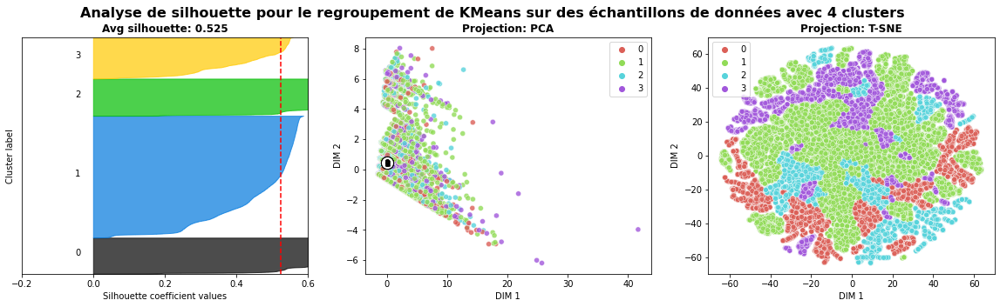

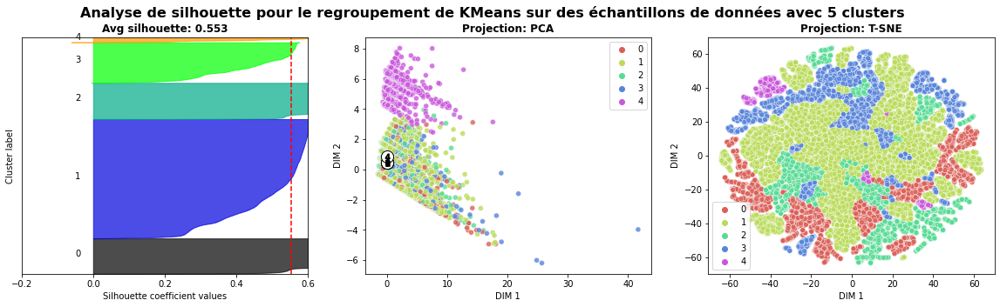

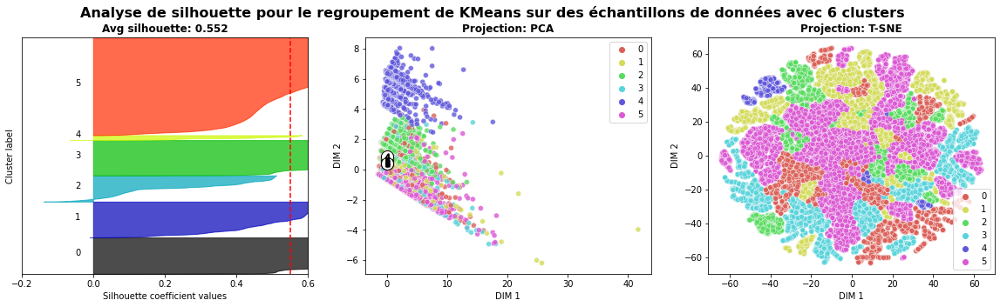

In [59]:
fonction.silhouette_pca_tsne(X_scaled_pca, X_reduced[:,:8], T, k_range=[4,5,6])

Veuillez définir la plage de valeur de K (2,...) pour l'affichage de l'EB: 10


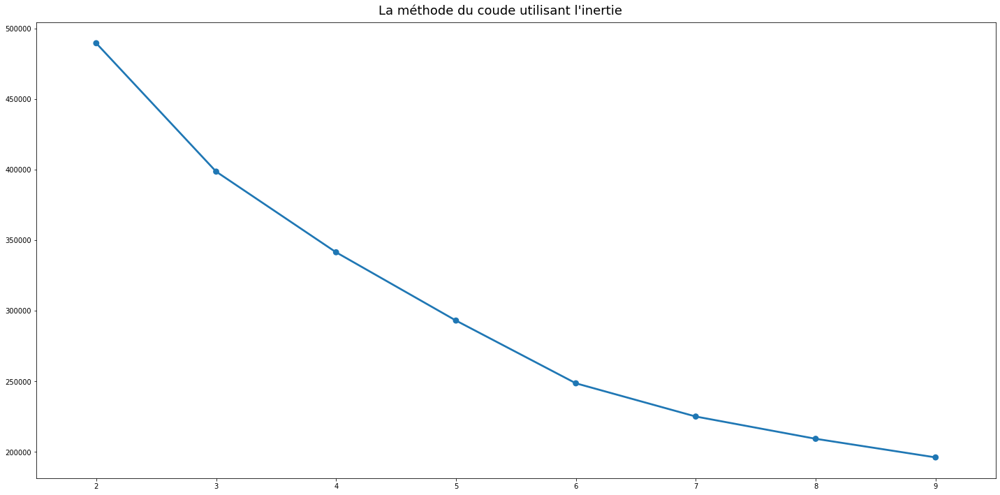

Veuillez définir le nombre de clusters : 6


,cout,insatisfaction,Nb_article,credit,delai_livraison,frais_livraison,categorie_maison,categorie_electronique_beaute,cluster_kmeans
customer_unique_id,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.433180,-0.756572,-0.075537,-1.882147,0.016937,-0.203362,0.765108,0.086783,2
0000b849f77a49e4a4ce2b2a4ca5be3f,-1.171613,0.183233,0.036623,0.077450,-0.152640,0.267131,-0.347915,-0.730229,0
0000f46a3911fa3c0805444483337064,0.675437,0.259362,-0.157923,-1.582355,-1.077967,-0.364166,-0.149232,0.060581,2
0000f6ccb0745a6a4b88665a16c9f078,-0.319180,-0.030443,-0.149044,-0.460754,-0.359430,-0.248015,-0.415266,0.730976,0
0004aac84e0df4da2b147fca70cf8255,0.342034,-0.727847,-0.173038,-1.031747,0.174000,0.071740,-0.401960,0.769626,2
...,...,...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,13.599939,-3.546709,-2.980295,6.744724,0.687672,-4.308855,-0.722925,-0.557364,4
fffea47cd6d3cc0a88bd621562a9d061,-0.658151,0.049560,-0.168987,0.481550,-0.161041,0.029059,-0.360538,-0.728078,0
ffff371b4d645b6ecea244b27531430a,-0.608846,-0.500638,-0.241237,0.549783,0.370855,-0.090411,-0.000737,-0.024802,0


In [49]:
df_kmeans_acp = fonction.segmentation(data_scale=acp_data,data_init=None,cah=False, 
                      method= 'ward', metric= 'euclidean', criterion= 'distance', 
                      Kmeans=True, init='k-means++', mixte_kmeans_cah=False, mixte_cah_kmeans=False, random_state=2611, silhouette=False)
df_kmeans_acp

#### <center><font color=darkOrange>2.5.1 - Synthèse </font></center>

,cout,insatisfaction,Nb_article,credit,delai_livraison,frais_livraison,categorie_maison,categorie_electronique_beaute
cluster,,,,,,,,
0,0.03,0.51,0.19,0.33,0.11,0.21,0.44,0.49
1,0.06,0.40,0.18,0.25,0.18,0.20,0.44,0.50
2,0.02,0.41,0.18,0.32,0.21,0.21,0.44,0.50
3,0.06,0.84,0.13,0.27,0.40,0.20,0.44,0.50
4,0.14,0.36,0.16,0.40,0.20,0.21,0.43,0.51
5,0.07,0.50,0.30,0.33,0.25,0.19,0.43,0.49
mean,0.03,0.44,0.18,0.31,0.19,0.21,0.44,0.50


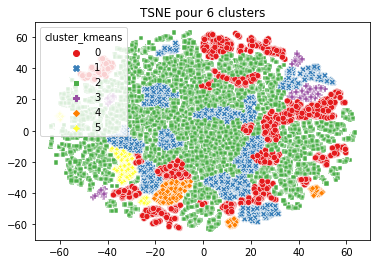

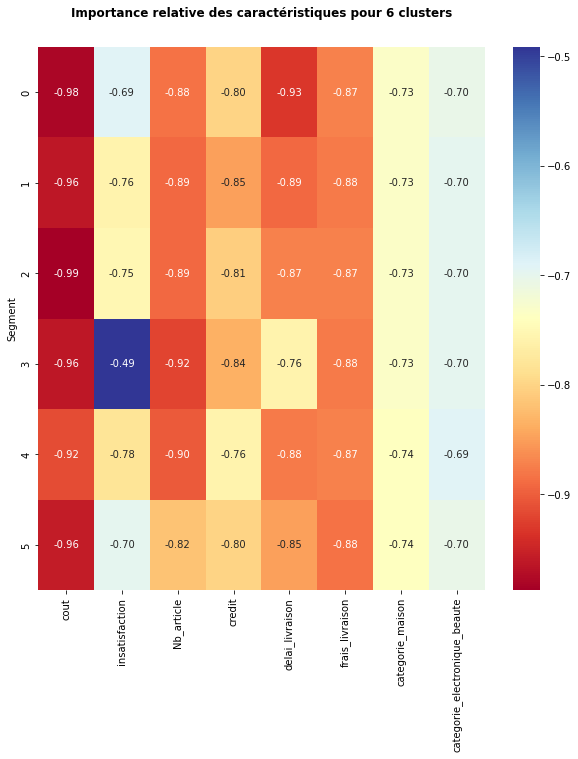

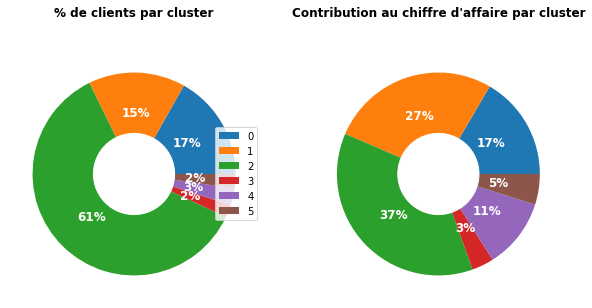

In [62]:
acp_k6 = fonction.kmeans_TSNE_analysis(X_scaled_pca,  df_kmeans_acp['cluster_kmeans'], 6,'cout', heatmap=True)

In [50]:
cluster_info_pca = fonction.cluster_info(abs(df_kmeans_acp),df_kmeans_acp['cluster_kmeans'], 
                                     seuil_importance_variable = 10, 
                                     seuil_cramer = 30, 
                                     correlations=True, 
                                     topVar=True, 
                                     chi2=True, 
                                     cramer=True) 

In [51]:
cluster_info_pca

,cout,insatisfaction,Nb_article,credit,delai_livraison,frais_livraison,categorie_maison,categorie_electronique_beaute,cluster_kmeans,clients,clients (%)
0,0.686401,0.383898,0.235718,0.379609,0.327220,0.260907,0.262680,0.244540,0.000000,56618.0,60.79
1,1.106772,5.803350,2.382878,0.930189,3.185930,0.558030,0.260286,0.255471,1.000000,1882.0,2.02
2,1.106039,0.699692,0.419967,1.332040,0.378964,0.573854,0.340733,0.221893,2.000000,14363.0,15.42
3,1.707850,1.050586,4.512673,0.945990,1.165386,0.951203,0.450312,0.192070,3.000000,2116.0,2.27
4,4.647044,1.305728,1.298456,1.874073,0.745854,2.525269,0.282413,0.228930,4.000000,2489.0,2.67
5,0.552785,1.112361,0.312675,0.539279,1.233243,0.367064,0.308702,0.259743,5.000000,15671.0,16.83
Gen,0.870000,0.700000,0.450000,0.620000,0.580000,0.410000,0.290000,0.240000,1.340000,NaN,NaN
%R2,47.808895,82.731098,62.039866,39.320482,66.963856,37.322120,1.876901,0.199729,100.000667,NaN,NaN


In [52]:
info_gp_pca = df_kmeans_acp.groupby("cluster_kmeans").mean()

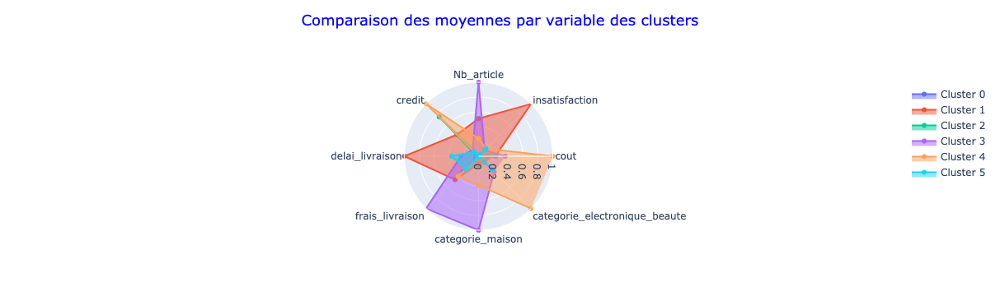

In [53]:
fonction.plot_radars(data=abs(info_gp_pca),stdScale=False)

In [54]:
abs(df_kmeans_acp)

,cout,insatisfaction,Nb_article,credit,delai_livraison,frais_livraison,categorie_maison,categorie_electronique_beaute,cluster_kmeans
customer_unique_id,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.433180,0.756572,0.075537,1.882147,0.016937,0.203362,0.765108,0.086783,2
0000b849f77a49e4a4ce2b2a4ca5be3f,1.171613,0.183233,0.036623,0.077450,0.152640,0.267131,0.347915,0.730229,0
0000f46a3911fa3c0805444483337064,0.675437,0.259362,0.157923,1.582355,1.077967,0.364166,0.149232,0.060581,2
0000f6ccb0745a6a4b88665a16c9f078,0.319180,0.030443,0.149044,0.460754,0.359430,0.248015,0.415266,0.730976,0
0004aac84e0df4da2b147fca70cf8255,0.342034,0.727847,0.173038,1.031747,0.174000,0.071740,0.401960,0.769626,2
...,...,...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,13.599939,3.546709,2.980295,6.744724,0.687672,4.308855,0.722925,0.557364,4
fffea47cd6d3cc0a88bd621562a9d061,0.658151,0.049560,0.168987,0.481550,0.161041,0.029059,0.360538,0.728078,0
ffff371b4d645b6ecea244b27531430a,0.608846,0.500638,0.241237,0.549783,0.370855,0.090411,0.000737,0.024802,0


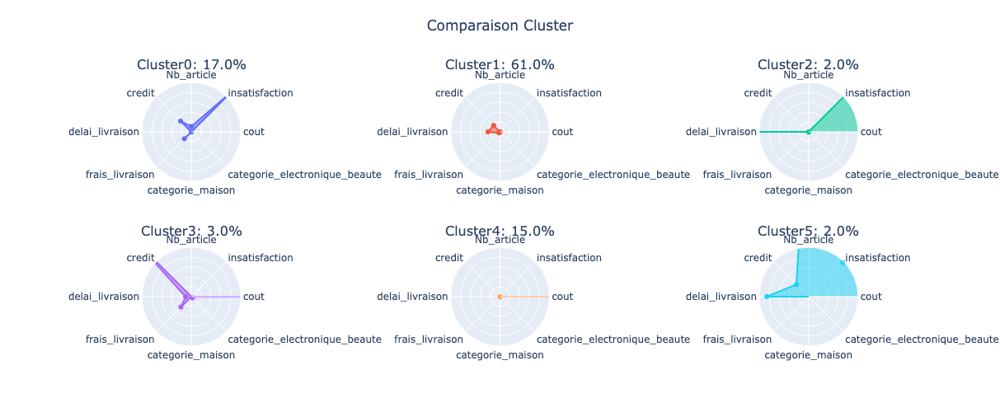

<Figure size 1440x2880 with 0 Axes>

In [31]:
fonction.plot_chart_clusters(df_kmeans_acp, info_gp_pca,'cluster_kmeans',
                               k_range=range(0,6), rows=2, cols=3)

In [55]:
info_acp_df = data.copy()
df_gp = pd.merge(info_acp_df, abs(df_kmeans_acp),
                               how='right', 
                               left_on='customer_unique_id', 
                               right_on='customer_unique_id'
                              )

In [56]:
df_gp.head(1)

,customer_unique_id,customer_city,customer_state,geolocation_lat,geolocation_lng,Frais_de_port,horaire_achat,date_achat,annee_mois,mois_achat,heure_achat,Note_Moyenne_Commentaire,Moy_Paiment,Facilités,Delai_Moyen_livraison,Nb_moyen_produits_par_commandes,categorie_la_plus_achetee,Total_moyen_achats,cout,insatisfaction,Nb_article,credit,delai_livraison,frais_livraison,categorie_maison,categorie_electronique_beaute,cluster_kmeans
0,0000366f3b9a7992bf8c76cfdf3221e2,cajamar,SP,-23.340262,-46.831085,12.0,6-11h,2018-05-10 10:56:27,201805,5,10.0,5.0,credit_card,8.0,7.0,1.0,home,129.9,0.43318,0.756572,0.075537,1.882147,0.016937,0.203362,0.765108,0.086783,2


In [57]:
data_gp = df_gp.groupby('cluster_kmeans').agg(
            {#'customer_state': lambda x: x.mode()[0],
             #'customer_city' : lambda x: x.mode()[0],
             'Frais_de_port': 'mean',
             #'horaire_achat': lambda x: x.mode()[0],
             #'heure_achat':'mean',
             #'mois_achat': lambda x: x.mode()[0],
             'Note_Moyenne_Commentaire': 'mean',
             #'Moy_Paiment': lambda x: x.mode()[0],
             'Facilités': 'mean',
             'Delai_Moyen_livraison': 'median',
             'Nb_moyen_produits_par_commandes': 'mean',
             'categorie_la_plus_achetee': lambda x: x.mode()[0],
             'Total_moyen_achats': 'mean',
             'cout': 'mean',
             'insatisfaction': 'mean',
             'Nb_article': 'mean',
             'credit': 'mean',
             'delai_livraison': 'mean',
             'frais_livraison': 'mean',
             'categorie_maison': 'mean',
             'categorie_electronique_beaute': 'mean',
             #'beaute': 'mean',
             #'sport': 'mean',
             #'electromenager / fashion ': 'mean',
            }
        ).reset_index()
data_gp = data_gp.set_index('cluster_kmeans')

data_gp

,Frais_de_port,Note_Moyenne_Commentaire,Facilités,Delai_Moyen_livraison,Nb_moyen_produits_par_commandes,categorie_la_plus_achetee,Total_moyen_achats,cout,insatisfaction,Nb_article,credit,delai_livraison,frais_livraison,categorie_maison,categorie_electronique_beaute
cluster_kmeans,,,,,,,,,,,,,,,
0,17.557913,4.751722,1.772369,10.0,1.059769,electronics,93.141327,0.686401,0.383898,0.235718,0.379609,0.327220,0.260907,0.262680,0.244540
1,21.517232,1.747078,3.064825,-17504.0,1.099362,electronics,156.939214,1.106772,5.803350,2.382878,0.930189,3.185930,0.558030,0.260286,0.255471
2,23.445537,4.425433,7.701386,11.0,1.108961,home,209.687249,1.106039,0.699692,0.419967,1.332040,0.378964,0.573854,0.340733,0.221893
3,20.013029,3.502836,3.816635,11.0,3.830813,home,273.335213,1.707850,1.050586,4.512673,0.945990,1.165386,0.951203,0.450312,0.192070
4,80.133696,4.050020,5.809964,14.0,1.116111,health_beauty,879.434146,4.647044,1.305728,1.298456,1.874073,0.745854,2.525269,0.282413,0.228930
5,19.089150,1.909482,2.240061,14.0,1.127688,home,105.175402,0.552785,1.112361,0.312675,0.539279,1.233243,0.367064,0.308702,0.259743


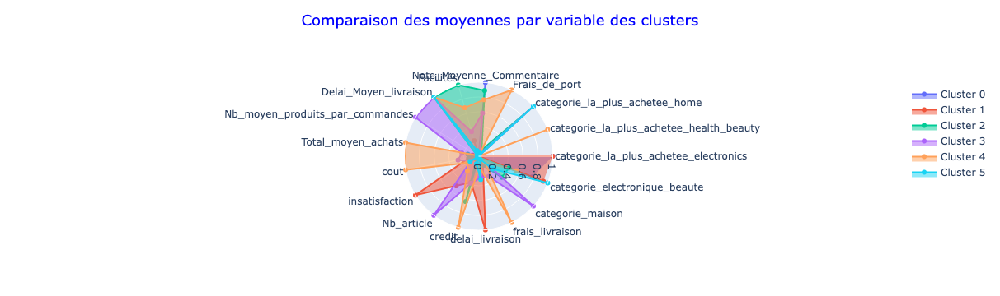

In [58]:
fonction.plot_radars(data=data_gp,stdScale=True)

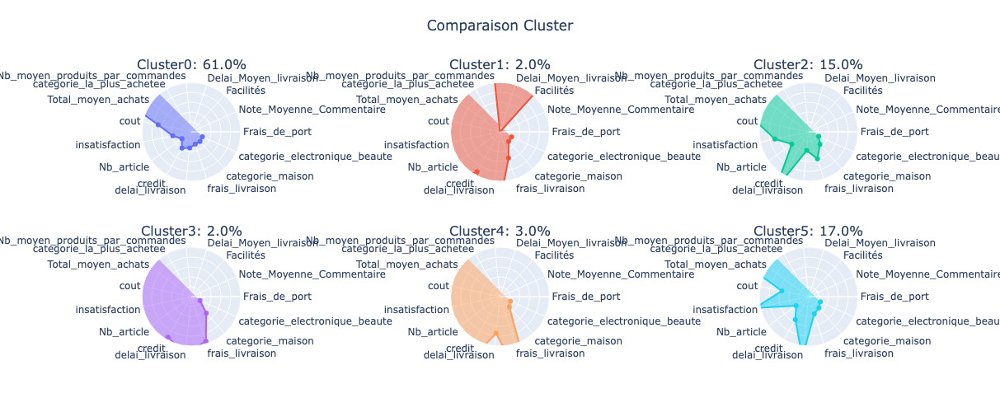

<Figure size 1440x2880 with 0 Axes>

In [59]:
fonction.plot_chart_clusters(df_kmeans_acp, data_gp,'cluster_kmeans',
                               k_range=range(0,6), rows=2, cols=3)

#### <center><font color=darkOrange>2.5.2 - Analyse géographique  </font></center>

In [60]:
data_geo = df_gp.groupby('cluster_kmeans').agg(lambda x:x.value_counts().index[0])
data_geo

,customer_unique_id,customer_city,customer_state,geolocation_lat,geolocation_lng,Frais_de_port,horaire_achat,date_achat,annee_mois,mois_achat,heure_achat,Note_Moyenne_Commentaire,Moy_Paiment,Facilités,Delai_Moyen_livraison,Nb_moyen_produits_par_commandes,categorie_la_plus_achetee,Total_moyen_achats,cout,insatisfaction,Nb_article,credit,delai_livraison,frais_livraison,categorie_maison,categorie_electronique_beaute
cluster_kmeans,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0000b849f77a49e4a4ce2b2a4ca5be3f,sao paulo,SP,-23.013945,-43.463020,15.10,14-18h,2018-03-17 15:49:23,201801,8,11.0,5.0,credit_card,1.0,8.0,1.0,electronics,59.9,0.857956,0.442274,0.142264,0.373183,0.367463,0.039847,0.011256,0.026616
1,0029bd580d3012618731f5abb174a07f,sao paulo,SP,-22.963222,-43.331756,15.10,14-18h,2017-11-02 13:24:21,201803,3,16.0,1.0,credit_card,1.0,-17494.0,1.0,electronics,129.9,0.446840,6.346277,2.330041,0.407910,2.886665,0.117643,0.045968,0.046769
2,0000366f3b9a7992bf8c76cfdf3221e2,sao paulo,SP,-23.013945,-43.463020,15.10,14-18h,2018-04-05 21:00:26,201711,5,16.0,5.0,credit_card,10.0,8.0,1.0,home,89.9,1.490464,1.022132,0.356000,1.961671,0.087195,0.597000,0.716448,0.120108
3,000fbf0473c10fc1ab6f8d2d286ce20c,sao paulo,SP,-22.999730,-43.401029,15.10,14-18h,2018-07-26 09:43:52,201711,5,16.0,5.0,credit_card,1.0,8.0,3.0,home,179.7,1.062939,0.361409,4.794762,1.124747,1.872920,0.612768,0.231304,0.083780
4,0028a7d8db7b0247652509358ad8d755,sao paulo,SP,-20.754545,-42.877870,71.53,14-18h,2017-12-13 15:49:39,201807,7,16.0,5.0,credit_card,10.0,9.0,1.0,health_beauty,599.0,3.580386,1.011701,1.381522,0.049775,0.778225,2.407462,0.590618,0.124157
5,00053a61a98854899e70ed204dd4bafe,sao paulo,SP,-22.999730,-43.401029,15.10,14-18h,2017-11-29 17:43:48,201803,3,15.0,1.0,credit_card,1.0,8.0,1.0,home,69.9,0.674634,1.738180,0.145012,0.352151,1.667037,0.794498,0.338651,0.646988


In [61]:
data_geo = data_geo.rename_axis('cluster_kmeans').reset_index()

In [67]:
import folium
m = folium.Map(location=[-15.7797200, -47.9297200], zoom_start=6)
colors = ["red", "grey", "orange", "green", "black",'blue']
#labels = ['c0','c1','c2','c3','c4','c5','c6','c7','c8','c9','c10','c11','c12','c13','c14']
for i, c in enumerate(colors):
    print("Cluster {0} is {1}".format(i, c))
    data_geo.apply(lambda row:folium.Marker(
        location=[row['geolocation_lat'], row['geolocation_lng']],
        popup = row['cluster_kmeans'],
        icon = folium.Icon(color=colors[row['cluster_kmeans']])).add_to(m), axis=1)

folium.Marker(
    location=[-25.495837920466105, -49.13327281431446],icon=folium.Icon(icon="home"),popup="Olist").add_to(m)

# Création des limites de zoom de la carte
sud_ouest = data_geo[["geolocation_lat","geolocation_lng"]].min().values.tolist()
nord_est = data_geo[["geolocation_lat","geolocation_lng"]].max().values.tolist()

# Appel du zoom maximum possible
m.fit_bounds([sud_ouest,nord_est])
m

Cluster 0 is red
Cluster 1 is grey
Cluster 2 is orange
Cluster 3 is green
Cluster 4 is black
Cluster 5 is blue


### <center><font color=darkGreen>3 - DBScan</font></center>

Text(0.5, 1.0, 'k distance graph')

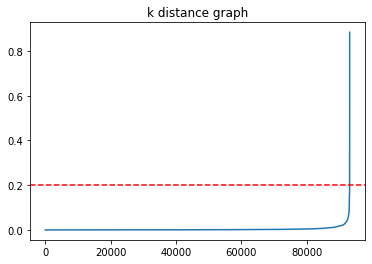

In [405]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_scaled_pca)
distances, indices = nbrs.kneighbors(X_scaled_pca)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.axhline(y=0.2, color='r', linestyle='--')
plt.title('k distance graph')

Text(0.5, 1.0, 'k distance graph')

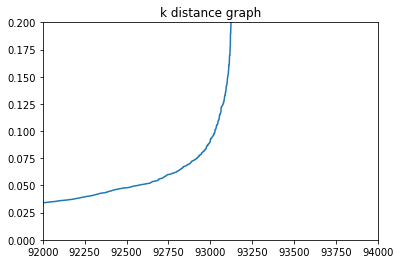

In [406]:
# Zoomer pour trouver la valeur optimale
plt.xlim(92000,94000)
plt.ylim(0,0.2)
plt.plot(distances)
#plt.axhline(y=0.100, color='r', linestyle='--')
plt.title('k distance graph')

Il semble que la valeur optimale de **ε** se situe autour de **0.125**.

In [408]:
# Compute DBSCAN
dbs = DBSCAN(eps=0.150, min_samples=5).fit(X_scaled_pca)

# List of clusters and their respective points
core_samples_mask = np.zeros_like(dbs.labels_, dtype=bool)
core_samples_mask[dbs.core_sample_indices_] = True
dbs_labels = dbs.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(dbs_labels)) - (1 if -1 in dbs_labels else 0)
n_noise_ = list(dbs_labels).count(-1)

print('Nombre de clusters estimé: %d' % n_clusters_)
print('Estimation du nombre de points de bruit: %d' % n_noise_)
print('Coefficient de silhouette: %0.3f' % silhouette_score(X_scaled_pca, dbs_labels))

Nombre de clusters estimé: 6
Estimation du nombre de points de bruit: 68
Coefficient de silhouette: 0.633


In [409]:
info_dbscan = X_scaled_pca.copy()
info_dbscan["cluster"] = dbs_labels

In [413]:
cluster_info_dbscan = fonction.cluster_info(acp_data, info_dbscan["cluster"], 
                                     seuil_importance_variable = 10, 
                                     seuil_cramer = 30, 
                                     correlations=True, 
                                     topVar=True, 
                                     chi2=True, 
                                     cramer=True) 

In [414]:
cluster_info_dbscan

,Frais_de_port,Note_Moyenne_Commentaire,Facilités,Delai_Moyen_livraison,Nb_moyen_produits_par_commandes,Total_moyen_achats,categorie_la_plus_achetee_appliances,categorie_la_plus_achetee_arts,categorie_la_plus_achetee_auto,categorie_la_plus_achetee_construction,categorie_la_plus_achetee_electronics,categorie_la_plus_achetee_fashion,categorie_la_plus_achetee_food_drinks,categorie_la_plus_achetee_garden_pets,categorie_la_plus_achetee_health_beauty,categorie_la_plus_achetee_home,categorie_la_plus_achetee_office,categorie_la_plus_achetee_other,categorie_la_plus_achetee_sports_leisure,clients,clients (%)
-1,99.293676,2.558824,5.735294,-4630.102941,6.161765,2050.388824,0.117647,0.014706,0.029412,0.029412,0.191176,0.029412,0.014706,0.044118,0.147059,0.132353,0.132353,0.044118,0.073529,68.0,0.07
0,21.243180,4.167802,3.067013,13.104768,1.157121,140.915799,0.108723,0.074462,0.057578,0.031386,0.000000,0.117570,0.014121,0.078322,0.000000,0.253248,0.062994,0.059802,0.141793,62958.0,67.60
1,19.368897,4.227978,3.094048,12.754254,1.092684,141.015438,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,13929.0,14.96
2,17.983181,4.094817,2.236849,13.712507,1.118005,119.985119,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14296.0,15.35
3,23.558136,1.767815,3.288175,-17483.619421,1.114330,170.766453,0.132341,0.085356,0.062647,0.027408,0.000000,0.137040,0.015662,0.064996,0.000000,0.216132,0.054033,0.054033,0.150352,1277.0,1.37
4,18.324334,1.699659,2.767918,-17502.986348,1.051195,129.809590,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,293.0,0.31
5,18.157830,1.705975,2.528302,-17483.374214,1.106918,154.868742,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,318.0,0.34
Gen,20.530000,4.120000,2.950000,-344.980000,1.140000,139.530000,0.080000,0.050000,0.040000,0.020000,0.160000,0.080000,0.010000,0.050000,0.150000,0.170000,0.040000,0.040000,0.100000,NaN,NaN
%R2,2.385950,6.814809,1.322826,99.276131,6.537931,6.112971,3.697865,2.448903,1.861335,1.003936,99.921319,3.989312,0.443341,2.588728,99.935332,9.495358,2.074689,1.931994,4.879720,NaN,NaN


,cout,satisfaction,frequence,credit,delai de livraison,frais de livraison,categorie maison,categorie electronique
cluster,,,,,,,,
-1,0.29,0.55,0.34,0.51,0.43,0.23,0.40,0.48
0,0.03,0.43,0.19,0.31,0.18,0.21,0.47,0.49
1,0.03,0.42,0.18,0.31,0.19,0.21,0.36,0.16
2,0.03,0.43,0.19,0.32,0.18,0.21,0.36,0.84
3,0.06,0.84,0.13,0.27,0.40,0.20,0.47,0.49
4,0.05,0.85,0.13,0.27,0.40,0.20,0.37,0.16
5,0.05,0.85,0.13,0.28,0.40,0.20,0.37,0.84
mean,0.03,0.44,0.18,0.31,0.19,0.21,0.44,0.50


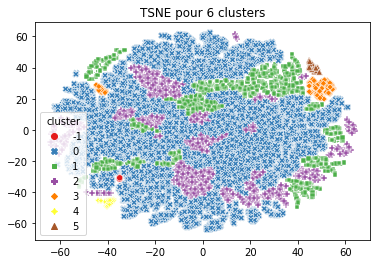

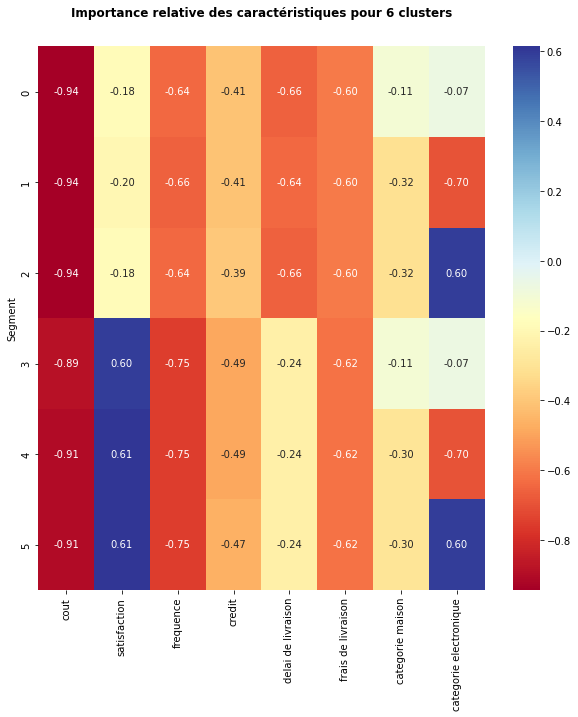

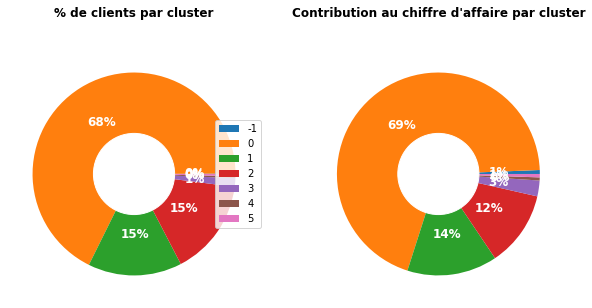

In [416]:
dbscan_k6 = fonction.kmeans_TSNE_analysis(X_scaled_pca,  info_dbscan['cluster'], 6,'cout', heatmap=True)

### <center><font color=darkBlue>4. - Conclusion </font></center>

Le modèle kMeans segmente notre jeu de données en 4 ou 6 clusters, dépendamment des features sélectionner.
<hr>

**<center><font color=DarkRed>l'analyse RFM :</font></center>**  
Il y a 2 clusters principaux qui ressortent, ce sont les clients qui achètent fréquemment, et ceux qui dépensent de gros montants. Ils représentent une minorité des clients, en effet seulement 10 % d'entre eux reviennent acheter sur le site, et ces 10 % sont classés parmi ces 2 clusters.

Les clients qui n'ont passé qu'une seule commande sont ceux placés dans les autres clusters.

Ces autres clusters segmentent principalement les clients en fonction de la récence, du groupe de clients ayant passé commande le plus récemment au groupe de clients ayant passé commande il y a longtemps.

Ajouter d'autres features dans notre modèle va simplement affiner la segmentation de nos clients n'ayant commandé qu'une seule fois.

**<font color=DarkGreen>L’analyse RFM n’est pas adaptée</font>** : Nous avons 90% d’achat unique ce qui biaise la récence, la fréquence quant à elle avantage les 10 % de client ayant effectué un réachat.
<hr>

**<center><font color=DarkRed>l'analyse du jeu de donnée initial :</font></center>**

La réduction de dimension montre qu'avec seulement 8 variables, 95% des données peuvent être expliquées. Le nombre de variables doit être réduit pour obtenir un modèle utilisable et compréhensible.

**<font color=DarkGreen>Il y a 6 thématiques principales qui ressortent</font>** :
- Coût, 
- insatisfaction, 
- nombre d’articles, 
- crédit, 
- les délais et frais de livraison

<hr>

**<center><font color=DarkRed>l'analyse DBScan:</font></center>**   
Cette méthode fait ressortir 6 clusters, mais nous constatons qu'il y a une sur-représentation du cluster 0, nous pouvons donc conclure que cette méthode n'est pas concluante.
<hr>

**<center><font color=DarkRed>L'analyse global :</font></center>**

- **<font color=DarkGreen>Classification intéressante pour la campagne de marketing ciblée :</font>** L’algorithme des K-means est le plus approprié

- **<font color=DarkGreen>Manque de données socio-démographique</font>** : Le fait d'ajouter des variable sur l'âge, le sexe, l'emploi, ...,  permettrait d'affiner la segmentation.


### <center><font color=darkBlue>5. - Enregistrement du dataset de segmentation final </font></center>

In [181]:
acp_data.to_csv('../data/acp_data.csv')